# matplotlibでのプロット

# import, 読みこみ

In [1]:
import numpy as np
import cdflib
import sympy as sp
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MultipleLocator, MaxNLocator, ScalarFormatter, FormatStrFormatter
from matplotlib.dates import MinuteLocator, SecondLocator, DateFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.signal import medfilt
from scipy.ndimage import median_filter
from scipy.stats import zscore
from scipy.optimize import fsolve, curve_fit
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.optimize import OptimizeWarning
import warnings
from matplotlib.colors import BoundaryNorm, Normalize
import datetime as dt

# CDFファイルのパス
file_path_1 = "/home/kinno-7010/Document/Iwai2020event/memo/data_file/2024_06/it_h1_hf_20240621_v01.cdf"

# CDFファイルを読み込み
cdf_file = cdflib.CDF(file_path_1)

# データの読み込み
epoch = cdf_file.varget('Epoch')  # 時間
frequency = cdf_file.varget('Frequency')  # 周波数
lh_data = cdf_file.varget('RH')  # パワーフラックス密度

# rhoの範囲(Baumbach-Allen modelの定義域:>1.2R, 215R = 1AU)
# rho_value = np.arange(1.2, 215, 0.01)
# 太陽半径：km
R_sun = 696340

# line plotの設定
thresholds = [95, 90, 85]
colors = ['blue', 'green', 'red']

 # カラーバーの最小値と最大値
vmin, vmax = 80, 95
F_value = [1.0, 10.0]

# 基準時間からのタイムスタンプ変換
base_time = pd.Timestamp('2024-06-21 00:00:00')
time = base_time + pd.to_timedelta(epoch - epoch[0], unit='ms')

## 関数

In [2]:
############################# 関数の定義 ##################################
####### カラープロット #######
def plot_filtered_lh_data(start_time, end_time, title, time_interval, frequency_interval, window_frequency_size):
    """
    指定された時間と周波数範囲に基づいてLHデータをプロットします。

    Parameters:
    -----------
    start_time: np.datetime64  プロットする開始時間
    end_time: np.datetime64    プロットする終了時間
    title: str                 プロットのタイトル
    start_frequency: float     プロットする最小周波数 (MHz)
    end_frequency: float       プロットする最大周波数 (MHz)
    epoch: np.ndarray          時刻データ (ミリ秒単位)
    frequency: np.ndarray      周波数データ (Hz)
    lh_data: np.ndarray        Power Flux Density (LH) データ
    vmin: float, optional      カラーバーの最小値
    vmax: float, optional      カラーバーの最大値
    """
    # 周波数をHzからMHzに変換
    start_frequency = float(input("min_frequency [MHz] = ")) * 1e6
    print("start_frequency = ", start_frequency)
    end_frequency = float(input("MAX_frequency [MHz] = ")) * 1e6
    print(f"end_frequency = {end_frequency}\n")

    #####################スライス#############################
    # 時間範囲でデータをスライス
    time_mask = (time >= start_time) & (time <= end_time)
    lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
    time_sliced = time[time_mask]  # 時間もスライス

    # 周波数範囲でデータをスライス
    freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
    lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
    frequency_sliced = frequency[freq_mask]  # 周波数もスライス
    frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換

    # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
    window_time_size = 1
    window_frequency_size = window_frequency_size
    filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))

    ##########################カラープロットの作成##################################
    fig, ax = plt.subplots(figsize=(12, 6))

    # カラーバーを図の右側に追加
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)  # sizeはカラーバーの幅, padは間隔

    # カラープロットの設定
    extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
    img = ax.imshow(filtered_lh_data.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

    # カラーバーの追加
    cbar = plt.colorbar(img, cax=cax)
    cbar.set_label(r'Power Flux Density (dBW/$\rm{m^2}$/Hz)', fontsize=24)
    cbar.ax.tick_params(labelsize=18)

    # 軸ラベルとタイトル
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='both', labelsize=18)

    ax.set_title(title, fontsize=20)

    # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))

    # 目盛りを設定
    ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))  # 60秒ごとに目盛りを追加
    y_major_locator = MultipleLocator(frequency_interval)  # 1MHzごとに目盛を追加
    ax.yaxis.set_major_locator(y_major_locator)
   

    # レイアウトの調整
    plt.tight_layout()
    plt.show()


# 外れ値を除去する関数（Zスコアを用いる）
# 外れ値を除去する関数（仮定）
def remove_outliers(data, threshold=3.0):
    if len(data) == 0:
        return data
    
    mean = np.mean(data)
    std = np.std(data)

    if std == 0:
        # If the standard deviation is zero, no outliers can be removed
        return data
    
    # Calculate Z-scores
    z_scores = np.abs((data - mean) / std)
    
    # Check if there are valid values within the threshold
    if np.isnan(z_scores).all():
        print("All data points are NaN after calculating Z-scores. Returning empty array.")
        return np.array([])

    # Apply threshold to remove outliers
    filtered_data = data[z_scores < threshold]

    # If filtering removes all data, return the original data to prevent empty arrays
    if len(filtered_data) == 0:
        print(f"Warning: Outlier removal left no valid data. Returning original data.")
        return data
    
    return filtered_data




##### 中心周波数を求める関数 #####
def find_center_frequencies(v_dim_slice, freq_bins, threshold):
    center_frequencies = []
    
    # 閾値適用後に中心周波数を計算
    v_dim_slice_filtered = np.where(v_dim_slice >= threshold, v_dim_slice, np.nan)
    
    for i in range(v_dim_slice_filtered.shape[0]):
        valid_freqs = freq_bins[~np.isnan(v_dim_slice_filtered[i])]
        if len(valid_freqs) > 0:
            averaged_freq = np.mean(valid_freqs)
            center_frequencies.append(averaged_freq)
        else:
            center_frequencies.append(np.nan)
    
    return np.array(center_frequencies)



##### 平滑化された中心周波数を計算する関数 #####
### 移動平均を適用する
def smoothed_center_frequencies(center_frequencies, window_size):
    # 平滑化前にNaNを適切に扱う
    center_frequencies_series = pd.Series(center_frequencies)
    
    # NaNを除外し、移動平均を計算（中心にNaNがある場合、その部分もNaNとして保持）
    smoothed = center_frequencies_series.rolling(window=window_size, min_periods=1, center=True).mean()
    
    # さらにNaN部分の平滑化を防ぐ
    smoothed = smoothed.where(~center_frequencies_series.isna(), np.nan)
    
    return smoothed.to_numpy()


def calculate_fit_line(time_sliced, center_frequencies_smoothed, color, threshold):
    # Extract non-NaN parts of the center frequencies
    valid_indices = ~np.isnan(center_frequencies_smoothed)
    time_valid = mdates.date2num(time_sliced[valid_indices])  # Convert to matplotlib date format
    center_freq_valid = center_frequencies_smoothed[valid_indices]

    # If no valid data, skip fitting
    if len(time_valid) == 0 or len(center_freq_valid) == 0:
        print(f"No valid data for threshold {threshold}, skipping fit.")
        return None, None

    # Apply outlier removal on valid data
    time_valid, center_freq_valid = remove_outliers(time_valid), remove_outliers(center_freq_valid)

    # Ensure time_valid and center_freq_valid have the same length after outlier removal
    min_length = min(len(time_valid), len(center_freq_valid))
    time_valid, center_freq_valid = time_valid[:min_length], center_freq_valid[:min_length]

    # If no data after removing outliers, skip fitting
    if len(time_valid) == 0 or len(center_freq_valid) == 0:
        print(f"No valid data after outlier removal for threshold {threshold}, skipping fit.")
        return None, None

    # Convert time to seconds for better scaling (from days)
    time_valid_seconds = (time_valid - time_valid[0]) * 86400  # Convert days to seconds

    # Fit a straight line using least squares method
    slope, intercept = np.polyfit(time_valid_seconds, center_freq_valid, 1)

    # Convert slope from MHz/seconds to MHz/s directly (no need for further conversion)
    slope_per_sec = slope

    # Calculate the fitted line values for the valid time points only
    fitted_line = slope * time_valid_seconds + intercept

    # Calculate the residuals (differences between actual and fitted values)
    residuals = center_freq_valid - fitted_line

    # Estimate the variance of the residuals
    residual_variance = np.var(residuals, ddof=2)  # Using ddof=2 for unbiased variance

    # Calculate the standard deviation of the slope and intercept
    N = len(time_valid_seconds)  # Number of data points
    time_mean = np.mean(time_valid_seconds)

    # Sum of squared differences from the mean of time_valid_seconds
    S_xx = np.sum((time_valid_seconds - time_mean) ** 2)

    # Standard errors (variances) of slope and intercept
    slope_std = np.sqrt(residual_variance / S_xx)  # Slope standard deviation
    intercept_std = np.sqrt(residual_variance * (1 / N + time_mean**2 / S_xx))  # Intercept standard deviation
    
    return slope_per_sec, intercept



### 多項式関数のフィッティングを計算する関数
def calculate_polynomial_fit(x_value, y_value, degree):
    # 多項式関数でフィッティング
    poly_coeffs = np.polyfit(x_value, y_value, deg=degree)
    poly_fit = np.poly1d(poly_coeffs)
    
    # フィットされた多項式の形を表示
    print(f"フィットされた多項式:{poly_fit}\n")
    
    # フィットした y 値と多項式関数そのものを返す
    return poly_fit(x_value), poly_fit



def fit_line_to_center_frequencies(ax, time_sliced, center_frequencies_smoothed, color, threshold):
    # Extract non-NaN parts of the center frequencies
    valid_indices = ~np.isnan(center_frequencies_smoothed)
    time_valid = mdates.date2num(time_sliced[valid_indices])  # Convert to matplotlib date format
    center_freq_valid = center_frequencies_smoothed[valid_indices]

    # If no valid data, skip fitting
    if len(time_valid) == 0 or len(center_freq_valid) == 0:
        print(f"No valid data for threshold {threshold}, skipping fit.")
        return None, None

    # Apply outlier removal on valid data
    time_valid, center_freq_valid = remove_outliers(time_valid), remove_outliers(center_freq_valid)

    # Ensure time_valid and center_freq_valid have the same length after outlier removal
    min_length = min(len(time_valid), len(center_freq_valid))
    time_valid, center_freq_valid = time_valid[:min_length], center_freq_valid[:min_length]

    # If no data after removing outliers, skip fitting
    if len(time_valid) == 0 or len(center_freq_valid) == 0:
        print(f"No valid data after outlier removal for threshold {threshold}, skipping fit.")
        return None, None

    # Convert time to seconds for better scaling (from days)
    time_valid_seconds = (time_valid - time_valid[0]) * 86400  # Convert days to seconds

    # Fit a straight line using least squares method
    slope, intercept = np.polyfit(time_valid_seconds, center_freq_valid, 1)

    # Convert slope from MHz/seconds to MHz/s directly (no need for further conversion)
    slope_per_sec = slope

    # Calculate the fitted line values for the valid time points only
    fitted_line = slope * time_valid_seconds + intercept

    # Calculate the residuals (differences between actual and fitted values)
    residuals = center_freq_valid - fitted_line

    # Estimate the variance of the residuals
    residual_variance = np.var(residuals, ddof=2)  # Using ddof=2 for unbiased variance

    # Calculate the standard deviation of the slope and intercept
    N = len(time_valid_seconds)  # Number of data points
    time_mean = np.mean(time_valid_seconds)

    # Sum of squared differences from the mean of time_valid_seconds
    S_xx = np.sum((time_valid_seconds - time_mean) ** 2)

    # Standard errors (variances) of slope and intercept
    slope_std = np.sqrt(residual_variance / S_xx)  # Slope standard deviation
    intercept_std = np.sqrt(residual_variance * (1 / N + time_mean**2 / S_xx))  # Intercept standard deviation

    # Output the fitted slope, intercept, and their standard deviations
    print(f"Slope (MHz/s) [Power>={threshold}]: {slope_per_sec:.4e}, Intercept: {intercept:.4e} MHz")
    print(f"Slope standard deviation (MHz/s) [Power>={threshold}]: {slope_std:.4e}")
    print(f"Intercept standard deviation (MHz) [Power>={threshold}]: {intercept_std:.4e} \n")

    # Plot the fitted line with error in the legend
    ax.plot(time_valid, fitted_line,
            label=f'$y=(${slope_per_sec:.2e}$\pm${slope_std:.2e})$x$\n  +({intercept:.2e}$\pm${intercept_std:.2e})',
            color=color, linestyle='--'
            )

    # Adjust plot labels and legend
    ax.set_xlabel('Time (UT)')
    ax.set_ylabel('Frequency (MHz)')
    ax.legend()

    return slope_per_sec, intercept




##### 中心周波数のラインプロットを作成する関数 #####
def center_frequency_line_plot(ax, time_sliced, center_frequencies_smoothed, window_smoothed_line, threshold, color, label):
    # NaN以外の部分をプロット
    valid_indices = ~np.isnan(center_frequencies_smoothed)
    ax.plot(
        mdates.date2num(time_sliced[valid_indices]), 
        center_frequencies_smoothed[valid_indices], 
        color=color, 
        linewidth=2, 
        label=f'Power$\geq${threshold}'
    )



# 外れ値を除外してドリフトレートを計算する関数
def calculate_drift_rate(center_frequencies, time_sliced):
    """
    中心周波数のドリフトレートを計算し、外れ値を除去します。
    """
    valid_indices = ~np.isnan(center_frequencies[:-1])
    time_sliced_valid = time_sliced[:-1][valid_indices]
    center_frequencies_valid = center_frequencies[:-1][valid_indices]

    # 周波数差分と時間差分を計算
    freq_diff = np.diff(center_frequencies_valid)
    time_diff = np.diff(time_sliced_valid.values).astype('timedelta64[ms]').astype(float) / 1000.0

    # 外れ値を除去
    freq_diff_no_outliers = remove_outliers(freq_diff)
    time_diff_no_outliers = time_diff[:len(freq_diff_no_outliers)]

    # ドリフトレートを計算
    freq_rate = freq_diff_no_outliers / time_diff_no_outliers
    
    return freq_rate



def print_drift_rate_statistics(freq_rates, thresholds):
    """
    複数のドリフトレートに対する統計（平均、標準偏差）を表示します。
    freq_rateがすべてnp.nanの場合、その配列は統計に含めません。

    Parameters:
    -----------
    freq_rates : list of np.ndarray        ドリフトレートのリスト
    """
    avg_rates = []
    std_devs = []

    print('◎ ドリフトレートの統計 ◎')
    
    for i, rate in enumerate(freq_rates):
        # freq_rateの中身がすべてNaNの場合、スキップ
        if np.isnan(rate).all():
            print(f"Warning: freq_rate[{i}] contains only NaN values. Skipping this dataset.")
            continue  # この配列は統計に含めない

        avg_rates.append(np.mean(rate))
        std_devs.append(np.std(rate))

        # 各ドリフトレートの統計を表示
        print(f"drift rate (center_frequencies_{i + 1}):", avg_rates[-1])
        print(f"drift rateの標準偏差 (center_frequencies_{i + 1}):", std_devs[-1])
        print('\n')

    if avg_rates:
        # 全体の統計を表示
        print('driftの平均値:', np.mean(avg_rates))
        print('標準偏差の平均値:', np.mean(std_devs))
    else:
        print('有効なドリフトレートデータがありません。\n')


    

# 中心周波数とドリフトレートを計算してプロットする関数
def plot_drift_rate_histogram(freq_rates, thresholds, histo_drift_title):
    """
    各周波数に対するドリフトレートのヒストグラムをプロットします。
    freq_rateがすべてnp.nanの場合、その配列はヒストグラムに表示しません。
    """
    fig, ax = plt.subplots(figsize=(12, 6))

    for i, freq_rate in enumerate(freq_rates):
        # freq_rateの中身がすべてNaNの場合、スキップ
        if np.isnan(freq_rate).all():
            print(f"Warning: freq_rate[{i}] contains only NaN values. Skipping this dataset.")
            continue  # この配列はヒストグラムに表示しない

        # ヒストグラムをプロット
        ax.hist(freq_rate, bins=50, alpha=0.5, label=f'Center Frequency (Power$\geq${thresholds[i]})', color=colors[i])

    # ラベルとタイトル
    ax.set_xlabel('Frequency drift rate (MHz/s)', fontsize=24)
    ax.set_ylabel('Frequency drift rate count', fontsize=24)
    ax.tick_params(axis='both', labelsize=18)
    ax.set_title(histo_drift_title, fontsize=24)
    ax.grid()
    ax.legend(fontsize=16)

    plt.tight_layout()
    plt.show()

### 密度モデル$(\rho : r/R_s [\rm{R_\odot}], n_e : [\rm{cm^{-3}}])$

* $1-10R_\odot \rightarrow n_e(\rho) = F \times 10^8  (2.99\rho^{-16} + 1.55\rho^{-6}) $ (Baumbach-Allen model [Allen, 1947])


In [3]:
# electron = 1.60217662e-19    # 電気素量：C
# m_e = 9.10938356e-31         # 電子の質量：kg
# epsilon_0 = 8.854187817e-12  # 真空の誘電率：F/m
# frequency_Hz =  1/(2*np.pi)* np.sqrt(electron**2/(epsilon_0*m_e))
# frequency_Hz

In [3]:
################# densityの計算 #################

# Baumbach-Allen model
def baumbach_allen_F_model(rho, factor):
    # Ensure rho is a numpy array to support element-wise operations
    rho = np.array(rho)
    return factor * 1e8 * (2.99 * np.power(rho, -16) + 1.55 * np.power(rho, -6))


# FxBaumbach-Allen modelを周波数に変換
def frequency_function(rho, factor):
    electron = 1.60217662e-19    # 電気素量：C
    m_e = 9.10938356e-31         # 電子の質量：kg
    epsilon_0 = 8.854187817e-12  # 真空の誘電率：F/m
    frequency_Hz =  1/(2*np.pi)* np.sqrt(electron**2/(epsilon_0*m_e))*1e3*np.sqrt(baumbach_allen_F_model(rho, factor))
    frequency_MHz = frequency_Hz / 1e6
    return frequency_MHz


def density_from_frequency(center_frequencies):
    electron = 1.60217662e-19    # 電気素量：C
    m_e = 9.10938356e-31         # 電子の質量：kg
    epsilon_0 = 8.854187817e-12  # 真空の誘電率：F/m
    
    density = (2*np.pi)**2*m_e*epsilon_0/(electron**2)*np.power(center_frequencies*1e3, 2)
    return density

def plot_density_time_evolution(time_sliced, density_values_dict, thresholds, time_interval, start_time, end_time, density_title):
    print('◎ 密度の計算 ◎')
    
    # プロット設定
    fig, ax = plt.subplots(figsize=(12, 6))
    
    for threshold in thresholds:
        if threshold not in density_values_dict:
            print(f"Warning: No data for threshold {threshold}. Skipping.")
            continue

        density_values = density_values_dict[threshold]

        # time_slicedとdensity_valuesの長さを一致させる
        min_length = min(len(time_sliced), len(density_values))
        time_sliced = time_sliced[:min_length]
        density_values = density_values[:min_length]
        
        valid_indices = ~np.isnan(density_values) & np.isfinite(density_values)  # NaNやInfを取り除く
        time_sliced_valid = time_sliced[valid_indices]
        density_values_valid = density_values[valid_indices]
        
        # データが全てNaNかどうかをチェック
        if np.isnan(density_values_valid).all():
            print(f"Warning: density for threshold={threshold} contains only NaN values.")
            continue
        
        # フィットラインの切片を取得
        density_0_fit = calculate_fit_line(time_sliced_valid, density_values_valid, colors[thresholds.index(threshold)], threshold)[1]
        
        print('density_0_fit:', density_0_fit)
        
        def calc_rho(n):
            try:
                # 周波数nからrhoを計算
                rho_value = fsolve(lambda rho: frequency_function(rho, 1) - n, x0=1.0)[0]
                return rho_value
            except Exception as e:
                print(f"Error solving rho for frequency {n} and factor {1}: {e}")
                return np.nan  # 解が見つからない場合

        # 各周波数に対してrhoを計算
        n = fsolve(lambda n: density_from_frequency(n) - density_0_fit, x0=1.0)[0]
        rho_0 = calc_rho(n)
        print('rho_0:', rho_0)
        
        # 時間差を秒に変換（TimedeltaArray -> float 秒数）
        time_diff_seconds = (pd.to_datetime(time_sliced_valid) - pd.to_datetime(time_sliced_valid[0])).total_seconds()

        # 速度定数と太陽半径で正規化
        velocity_constant = 200
        R_sun = 696340000  # 太陽半径 [m]
        rho_xaxis = rho_0 + velocity_constant * time_diff_seconds / R_sun

        # rho_xaxisとdensity_values_validの長さを一致させる
        min_length_valid = min(len(rho_xaxis), len(density_values_valid))
        rho_xaxis = rho_xaxis[:min_length_valid]
        density_values_valid = density_values_valid[:min_length_valid]
         
        # ヒストグラムをプロット（各thresholdごとに別々のラベル）
        ax.plot(rho_xaxis, density_values_valid, label=f'Power$\geq${threshold}', color=colors[thresholds.index(threshold)])
        fit_line_to_center_frequencies(ax, rho_xaxis, density_values_valid, colors[thresholds.index(threshold)], threshold)
        
        ax.tick_params(axis='both', labelsize=16)
        
    # ラベルとタイトルを設定
    ax.set_xlabel(r'$\rho$ ($\rm{R_\odot}$)', fontsize=24)
    ax.set_ylabel('Density (cm$^{-3}$)', fontsize=24)
    ax.set_title(density_title, fontsize=24)
    ax.grid()
    ax.legend(fontsize=14)
    
    # 時間軸のフォーマットを設定
    # ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    # ax.set_xlim(mdates.date2num(start_time), mdates.date2num(end_time))
    # ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))
    ax.tick_params(axis='both', labelsize=16)
    plt.tight_layout()
    plt.show()
    


def calculate_and_plot_density_ratio(time_sliced, density_values_dict, thresholds, time_interval, start_time, end_time, density_ratio_title):
    print('◎ 密度比の計算 ◎')   
    fig, axs = plt.subplots(2,1,figsize=(10,8), sharex=True)
    
    ax1, ax2 = axs
    
    
    for threshold in thresholds:
        if threshold not in density_values_dict:
            print(f"Warning: No data for threshold {threshold}. Skipping.")
            continue

        density_values = density_values_dict[threshold]

        # time_slicedとdensity_valuesの長さを一致させる
        min_length = min(len(time_sliced), len(density_values))

        time_sliced = time_sliced[:min_length]
        density_values = density_values[:min_length]
        
        if np.isnan(density_values).all():
            print(f"Warning: density for threshold={threshold} contains only NaN values.")
            continue
        
        # 差分(delta_density)を計算
        delta_density = np.diff(density_values)
        
        # 元の密度を差分に合わせてスライス
        density_values = density_values[:-1]
        time_sliced = time_sliced[:-1]
        
        density_values_avg = smoothed_center_frequencies(density_values, 2)

        # delta_density / density_valueの比率を計算
        density_ratio = delta_density / density_values_avg
        # density_ratio = remove_outliers(density_ratio)
    
        valid_indices = ~np.isnan(density_ratio)
        time_sliced = time_sliced[valid_indices]
        density_ratio = density_ratio[valid_indices]
        
        print(f'Average density_ratio [Power>={threshold}]:', np.mean(density_ratio))
        print(f'std density_ratio [Power>={threshold}]:', np.std(density_ratio))

        # 実際のデータとフィットした直線をプロット
        ax1.plot(time_sliced, density_ratio, label=f'Power$\geq${threshold}', color=colors[thresholds.index(threshold)])
        fit_line_to_center_frequencies(ax1, time_sliced, density_ratio, colors[thresholds.index(threshold)], threshold)
        
        fit_line_to_center_frequencies(ax2, time_sliced, density_ratio, colors[thresholds.index(threshold)], threshold)
    
    # ラベルとタイトルを設定
    # ax1.set_xlabel('Time (UT)', fontsize=24)
    ax1.set_ylabel('Delta Density / Density', fontsize=24)
    # ax1.set_title(density_ratio_title, fontsize=24)
    ax1.grid()
    ax1.legend(fontsize=12)
    
    # 時間軸のフォーマットを設定
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax1.set_xlim(mdates.date2num(start_time), mdates.date2num(end_time))
    ax1.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))
    ax1.tick_params(axis='both', labelsize=16)
    ax1.tick_params(axis='x', which='both', labelbottom=False)
    
    ax2.set_xlabel('Time (UT)', fontsize=24)
    ax2.set_ylabel('Delta Density / Density', fontsize=24)
    ax1.set_title(density_ratio_title, fontsize=24)
    ax2.grid()
    ax2.legend(fontsize=12)
    
    # 時間軸のフォーマットを設定
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax2.set_xlim(mdates.date2num(start_time), mdates.date2num(end_time))
    ax2.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))
    ax2.tick_params(axis='both', labelsize=16)
    ax2.yaxis.set_major_formatter(FormatStrFormatter('%.1e'))
    
    plt.tight_layout()
    plt.show()



def moving_average(data, window_size):
    """Calculate the moving average of the given data."""
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')



def print_density_ratio_from_line_fit_statistics(time_sliced, density_values_dict, thresholds, density_ratio_title, start_time, end_time, time_interval):
    print('◎ 密度比の統計 ◎')
    
    # 各thresholdのフィット結果を格納する辞書
    density_fit_dict = {}
    
    fig, ax = plt.subplots(figsize=(12, 6))
    
    for threshold in thresholds:
        if threshold not in density_values_dict:
            continue
        density_values = density_values_dict[threshold]

        # 長さを揃える
        min_length = min(len(time_sliced), len(density_values))
        time_sliced_valid = time_sliced[:min_length]
        density_values_valid = density_values[:min_length]
        
        valid_indices = ~np.isnan(density_values_valid)
        time_sliced_valid = time_sliced_valid[valid_indices]
        density_values_valid = density_values_valid[valid_indices]
        
        # 最小二乗法でスロープと切片を計算
        slope_per_sec, intercept = calculate_fit_line(time_sliced_valid, density_values_valid, colors[thresholds.index(threshold)], threshold)
        
        # スロープと切片が計算できた場合のみ処理を進める
        if slope_per_sec is None or intercept is None:
            continue
        
        # 時刻を数値に変換（フィッティング結果をプロットするため）
        time_num = mdates.date2num(time_sliced_valid)
        time_num_seconds = (time_num - time_num[0]) * 86400  # 秒に変換
        
        # フィッティング結果 y = ax + b を計算
        density_fit = slope_per_sec * time_num_seconds + intercept
        
        # フィットされた結果を辞書に格納
        density_fit_dict[threshold] = density_fit
        
        # 差分と移動平均をリセット（毎回新しく作る）
        delta_density = []
        density_smoothed = []
        density_ratio_value = []
        valid_time_sliced = []

        # 1. 差分と移動平均を直接計算
        for i in range(len(density_fit) - 1):
            # NaNや無限大が含まれている場合はスキップ
            if np.isnan(density_fit[i]) or np.isnan(density_fit[i + 1]) or np.isinf(density_fit[i]) or np.isinf(density_fit[i + 1]):
                continue

            delta_density_value = density_fit[i + 1] - density_fit[i]  # 差分を計算
            smoothed_value = (density_fit[i] + density_fit[i + 1]) / 2  # 移動平均を計算
            
            # density_ratio_valueの計算
            ratio_value = delta_density_value / smoothed_value
            
            # 有効な値だけを格納（NaNや無限大を除外）
            if not np.isnan(ratio_value) and not np.isinf(ratio_value):
                delta_density.append(delta_density_value)
                density_smoothed.append(smoothed_value)
                density_ratio_value.append(ratio_value)
                valid_time_sliced.append(time_sliced_valid[i])

        # 長さの調整を行う (remove_outliersの後)
        density_ratio_value_filtered = remove_outliers(density_ratio_value)
        
        # valid_time_sliced と density_ratio_value の長さが異なる場合は揃える
        if len(valid_time_sliced) > len(density_ratio_value_filtered):
            valid_time_sliced = valid_time_sliced[:len(density_ratio_value_filtered)]
        elif len(density_ratio_value_filtered) > len(valid_time_sliced):
            density_ratio_value_filtered = density_ratio_value_filtered[:len(valid_time_sliced)]

        # density_ratio_valueの平均値を表示
        if len(density_ratio_value_filtered) > 0:
            print(f'Threshold {threshold}: Average density ratio [/cc /s] = {np.mean(density_ratio_value_filtered)}')
        
            # 2. density_ratio_valueを時間とともにプロット
            ax.plot(valid_time_sliced, density_ratio_value_filtered, label=f'Density Ratio: avg={np.mean(density_ratio_value_filtered):.3e}(Power$\geq${threshold})', color=colors[thresholds.index(threshold)])
    
    # ラベルとタイトルを設定
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Density Ratio', fontsize=24)
    ax.set_title(density_ratio_title + ' from fit line', fontsize=24)
    ax.grid()
    ax.legend(fontsize=12)
    
    # 時間軸のフォーマットを設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(start_time), mdates.date2num(end_time))
    ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))
    ax.tick_params(axis='both', labelsize=16)
    
    # y軸の目盛を科学表記法に設定
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2e'))
    
    plt.tight_layout()
    plt.show()
    
    return density_ratio_value


def plot_density_distance_evolution(time_sliced, density_values_dict, thresholds, time_interval, start_time, end_time, density_title):
    print('◎ 密度の計算 ◎')
    
    # プロット設定
    fig, ax = plt.subplots(figsize=(12, 6))
    
    for threshold in thresholds:
        if threshold not in density_values_dict:
            print(f"Warning: No data for threshold {threshold}. Skipping.")
            continue

        density_values = density_values_dict[threshold]

        # time_slicedとdensity_valuesの長さを一致させる
        min_length = min(len(time_sliced), len(density_values))
        time_sliced = time_sliced[:min_length]
        density_values = density_values[:min_length]
        
        valid_indices = ~np.isnan(density_values) & np.isfinite(density_values)  # NaNやInfを取り除く
        time_sliced_valid = time_sliced[valid_indices]
        density_values_valid = density_values[valid_indices]
        
        # データが全てNaNかどうかをチェック
        if np.isnan(density_values_valid).all():
            print(f"Warning: density for threshold={threshold} contains only NaN values.")
            continue
        
        # フィットラインの切片を取得
        density_0_fit = calculate_fit_line(time_sliced_valid, density_values_valid, colors[thresholds.index(threshold)], threshold)[1]
        
        print('density_0_fit:', density_0_fit)
        
        def calc_rho(n):
            try:
                # 周波数nからrhoを計算
                rho_value = fsolve(lambda rho: frequency_function(rho, 1) - n, x0=1.0)[0]
                return rho_value
            except Exception as e:
                print(f"Error solving rho for frequency {n} and factor {1}: {e}")
                return np.nan  # 解が見つからない場合

        # 各周波数に対してrhoを計算
        n = fsolve(lambda n: density_from_frequency(n) - density_0_fit, x0=1.0)[0]
        rho_0 = calc_rho(n)
        print('rho_0:', rho_0)
        
        # 時間差を秒に変換（TimedeltaArray -> float 秒数）
        time_diff_seconds = (pd.to_datetime(time_sliced_valid) - pd.to_datetime(time_sliced_valid[0])).total_seconds()

        # 速度定数と太陽半径で正規化
        velocity_constant = 200
        R_sun = 696340  # 太陽半径 [km]
        rho_xaxis = rho_0 + velocity_constant * time_diff_seconds / R_sun

        # rho_xaxisとdensity_values_validの長さを一致させる
        min_length_valid = min(len(rho_xaxis), len(density_values_valid))
        rho_xaxis = rho_xaxis[:min_length_valid]
        density_values_valid = density_values_valid[:min_length_valid]
         
        # ヒストグラムをプロット（各thresholdごとに別々のラベル）
        ax.plot(rho_xaxis-1, density_values_valid, label=f'Power$\geq${threshold}', color=colors[thresholds.index(threshold)])
        # fit_line_to_center_frequencies(ax, rho_xaxis, density_values_valid, colors[thresholds.index(threshold)], threshold)
        # 多項式関数でフィッティング
        degree = 1
        poly_fit_values, poly_fit_function = calculate_polynomial_fit(rho_xaxis, density_values_valid, degree=degree)
    
        ax.plot(rho_xaxis-1, poly_fit_values, linestyle='--', color=colors[thresholds.index(threshold)], label=f'Poly fit (degree={degree}; Power$\geq${threshold}){poly_fit_function}')
        print('polyfit:', poly_fit_function)
        
        
    ax.tick_params(axis='both', labelsize=18)
        
    # ラベルとタイトルを設定
    ax.set_xlabel(r'Height from solar surface ($\rm{R_\odot}$)', fontsize=24)
    ax.set_ylabel('Density (cm$^{-3}$)', fontsize=24)
    ax.set_title(density_title, fontsize=24)
    ax.grid()
    # ax.tick_params(axis='both', which='major', labelsize=16)
    ax.set_yscale('log')
    ax.legend(fontsize=16)
    
    # 時間軸のフォーマットを設定
    # ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    # ax.set_xlim(mdates.date2num(start_time), mdates.date2num(end_time))
    # ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))
    # ax.tick_params(axis='both', labelsize=16)
    plt.tight_layout()
    plt.show()





        


    
    
############################### rhoの計算 ##################################
def rho_from_frequency(center_frequencies, time_sliced, factors):
    # center_frequencies と time_sliced の長さを揃える
    min_length = min(len(center_frequencies), len(time_sliced))
    center_frequencies = center_frequencies[:min_length]
    time_sliced = time_sliced[:min_length]

    x0 = 1.0  # 初期値
    valid_indices = ~np.isnan(center_frequencies)
    
    center_frequencies_valid = center_frequencies[valid_indices]
    
    # factorsがリストでない場合リストに変換
    if not isinstance(factors, (list, np.ndarray)):
        factors = [factors]

    valid_rho_values_dict = {}

    # 複数のfactorに対してrhoを計算
    for factor in factors:
        def calc_rho(n):
            try:
                rho_value = fsolve(lambda rho: frequency_function(rho, factor) - n, x0=x0)[0]
                return rho_value
            except Exception as e:
                print(f"Error solving rho for frequency {n} and factor {factor}: {e}")
                return np.nan  # 解が見つからない場合

        # 各周波数に対してrhoを計算
        rho_values = np.array([calc_rho(n) for n in center_frequencies_valid])
        valid_rho_values_dict[factor] = rho_values  # 各factorに対してrhoを辞書に追加
    
    return valid_rho_values_dict
    
    


# 外れ値を除去してrhoの差分を計算する関数
def calculate_rho_difference(center_frequencies, time_sliced, factor):
    # rho_from_frequency から center_frequencies に基づいた valid_rho_values を取得
    valid_rho_values_dict, time_sliced_valid = rho_from_frequency(center_frequencies, time_sliced, factor)
    
    # factorに対応する rho 値を取得
    valid_rho_values = valid_rho_values_dict.get(factor, np.array([]))

    # valid_rho_valuesが空の場合は処理を終了
    if len(valid_rho_values) == 0 or valid_rho_values.ndim == 0:
        print("Warning: No valid rho values.")
        return np.array([]), np.array([]), np.array([])

    # 外れ値を除去
    valid_rho_values_filtered = remove_outliers(valid_rho_values, threshold=5.0)

    # 外れ値除去後にNaNを除く
    valid_indices = ~np.isnan(valid_rho_values_filtered)
    
    # 外れ値がすべて除去されていた場合
    if np.sum(valid_indices) == 0:
        print("Warning: All values were removed as outliers.")
        return np.array([]), np.array([]), np.array([])

    valid_rho_values_filtered = valid_rho_values_filtered[valid_indices]

    # time_sliced_valid も同じ長さに合わせる
    time_sliced_valid_filtered = time_sliced_valid[valid_indices]

    # インデックスの長さを確認し、一致させる
    if len(valid_rho_values_filtered) != len(time_sliced_valid_filtered):
        raise ValueError(f"Length of valid_rho_values_filtered ({len(valid_rho_values_filtered)}) and time_sliced_valid_filtered ({len(time_sliced_valid_filtered)}) do not match.")

    # rhoの差分を計算
    rho_diff_valid = np.diff(valid_rho_values_filtered)

    return valid_rho_values_filtered, rho_diff_valid, time_sliced_valid_filtered


def plot_rho_time_evolution(time_sliced, smoothed_frequencies, rho_values_dict, thresholds, start_time, end_time, time_interval, rho_title):
    factor = 1.0  # Set factor to 1.0 as requested

    fig, ax = plt.subplots(figsize=(12, 6))
    
    for threshold in thresholds:
        if threshold not in rho_values_dict:
            print(f"Warning: No data for threshold {threshold}. Skipping.")
            continue

        factors_dict = rho_values_dict[threshold]

        if factor not in factors_dict['rho_values']:
            print(f"Warning: No data for factor {factor} at threshold {threshold}. Skipping.")
            continue

        rho_values = factors_dict['rho_values'][factor]
        time_sliced_valid = factors_dict['time_sliced']

        # Remove NaN values from rho_values and corresponding time_sliced values
        non_nan_indices = ~np.isnan(rho_values)
        rho_values_non_nan = rho_values[non_nan_indices]
        time_sliced_non_nan = time_sliced_valid[non_nan_indices]

        # Skip if no valid data
        if len(rho_values_non_nan) == 0:
            print(f"Warning: No valid rho values for threshold={threshold}, factor={factor}.")
            continue

        # Calculate the time differences after removing NaNs
        diff_time_sliced_non_nan = np.diff(time_sliced_non_nan).astype('timedelta64[s]').astype(float)

        # Ensure consistent lengths
        if len(diff_time_sliced_non_nan) != len(rho_values_non_nan) - 1:
            rho_values_non_nan = rho_values_non_nan[:-1]

        # Calculate velocity
        velocity_value = rho_values_non_nan * R_sun / diff_time_sliced_non_nan  # km/s

        # Plot the data
        ax.plot(time_sliced_non_nan[:-1], velocity_value, label=f'Power$\geq${threshold};\nAvg velocity:{np.mean(velocity_value)} km/s', color=colors[thresholds.index(threshold)])

        # Fit line to center frequencies (assuming this is a defined function)
        fit_line_to_center_frequencies(ax, time_sliced_non_nan[:-1], velocity_value, colors[thresholds.index(threshold)], threshold)

        ax.tick_params(axis='both', labelsize=18)
    
    # Set labels and formatting
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel(r'Velocity (km/s)', fontsize=24)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))
    ax.xaxis.set_major_locator(SecondLocator(interval=time_interval))
    ax.grid()
    ax.set_title(rho_title, fontsize=24)

    ax.legend(fontsize=16)
    ax.tick_params(axis='x', which='both', labelbottom=False)  # Hide time ticks
    plt.tight_layout()








############################### バースト速度の計算 ##################################
# def burst_velocity_function(center_frequencies, time_sliced, factors, threshold=3.0):
#     burst_velocity_dict = {}

#     # NaNを除いた有効なインデックスを取得
#     valid_indices = ~np.isnan(center_frequencies[:-1])
#     time_sliced_valid = time_sliced[:-1][valid_indices]
#     center_frequencies_valid = center_frequencies[:-1][valid_indices]

#     # 時間差を計算 (秒単位)
#     time_diff_valid = np.diff(time_sliced_valid).astype('timedelta64[s]').astype(float)

#     for factor_value in factors:
#         # rhoの差分を計算（calculate_rho_differenceで外れ値除去済み）
#         rho_diff_valid = calculate_rho_difference(center_frequencies_valid, time_sliced, factor_value)[1]

#         # rho_diff_valid と time_diff_valid のサイズを一致させる
#         min_len = min(len(rho_diff_valid), len(time_diff_valid))
#         rho_diff_valid = rho_diff_valid[:min_len]
#         time_diff_valid = time_diff_valid[:min_len]

#         # velocity_burstの計算
#         burst_velocity = rho_diff_valid * R_sun / time_diff_valid  # km/s

#         # 外れ値を除去（さらに速度バーストに対しても外れ値を除去）
#         burst_velocity = remove_outliers(burst_velocity, threshold)

#         # 各factorに対する速度バーストの値を辞書に格納
#         burst_velocity_dict[factor_value] = burst_velocity

#     return burst_velocity_dict

def burst_velocity_function(center_frequencies, time_sliced, factors, color, threshold):
    burst_velocity_dict = {}

    # Print the initial center_frequencies for debugging
    print(f"Original center_frequencies (before interpolation): {center_frequencies[:10]}")
    
    # Check if there are NaN values and perform interpolation
    if np.isnan(center_frequencies).any():
        print("Interpolating NaN values in center_frequencies...")
        center_frequencies = pd.Series(center_frequencies).interpolate().to_numpy()
    
    # Debug: Print interpolated data
    print(f"Interpolated center_frequencies: {center_frequencies[:10]}")

    # NaNを除いた有効なインデックスを取得
    valid_indices = ~np.isnan(center_frequencies)
    time_sliced = time_sliced[valid_indices]
    center_frequencies = center_frequencies[valid_indices]
    
    # Print after filtering NaN values
    print(f"Filtered center_frequencies: {center_frequencies[:10]}")
    print(f"Filtered time_sliced: {time_sliced[:10]}")

    # Ensure valid data after interpolation
    if len(time_sliced) == 0 or len(center_frequencies) == 0:
        raise ValueError("Error: No valid data found for time_sliced or center_frequencies after interpolation.")

    if len(time_sliced) != len(center_frequencies):
        raise ValueError(f"Error: Length of time_sliced ({len(time_sliced)}) and center_frequencies ({len(center_frequencies)}) do not match.")


    # time_sliced_valid[0]からの時間
    time_seconds = (time_sliced - time_sliced[0]) / np.timedelta64(1, 's')

    # 時間差を計算 (秒単位)
    time_diff = np.diff(time_seconds)

    if len(time_diff) == 0:
        raise ValueError("Error: No valid time differences calculated.")

    # Main processing loop
    for factor_value in factors:
        # 最小二乗法でのフィッティング
        center_frequencies_slope_fit_line, center_frequencies_intercept_fit_line = calculate_fit_line(time_sliced, center_frequencies, color, threshold)
        
        # fit lineの式
        center_frequency_fitted_line = center_frequencies_slope_fit_line * time_seconds + center_frequencies_intercept_fit_line
        
        print(f'Frequency\nslope [Power>={threshold}]:{center_frequencies_slope_fit_line}, intercept [Power>={threshold}]:{center_frequencies_intercept_fit_line}\n')
        
        # ρ_valueを求める
        rho_value = rho_from_frequency(center_frequency_fitted_line, time_sliced, factor_value)
        
        rho_value_for_factor = rho_value.get(factor_value, None)  # factor_valueに対応する値を取得
        if rho_value_for_factor is None:
            raise KeyError(f"Factor value {factor_value} not found in rho_value.")
        
        # rho_valueがスカラーか配列かを確認
        if np.isscalar(rho_value_for_factor):
            print(f"rho_value_for_factor is scalar: {rho_value_for_factor}, skipping diff calculation.")
            continue  # スカラーの場合、差分を計算できないためスキップする

        # time_diff_validの時間に対応するrho_diff_validを計算
        rho_diff = np.diff(rho_value_for_factor)
        
        # rho_diff_validとtime_diff_validのサイズを一致させる
        min_len = min(len(rho_diff), len(time_diff))
        rho_diff = rho_diff[:min_len]
        time_diff = time_diff[:min_len]

        if len(rho_diff) == 0 or len(time_diff) == 0:
            print(f"Warning: No valid rho or time differences for factor {factor_value}. Skipping.")
            continue

        # velocity_burstの計算
        burst_velocity = rho_diff * R_sun / time_diff  # km/s

        # 各factorに対する速度バーストの値を辞書に格納
        burst_velocity_dict[factor_value] = burst_velocity

    return burst_velocity_dict





# def print_burst_velocity_time_evolution(time_sliced, burst_velocity_dict, center_frequencies, thresholds, F_value, start_time, end_time, time_interval, burst_velocity_title):
#     # 各factorに対してプロットを作成する
#     for factor in F_value:
#         fig, ax = plt.subplots(figsize=(12, 6))

#         for threshold in thresholds:
#             if threshold not in burst_velocity_dict:
#                 print(f"Warning: No data for threshold {threshold}. Skipping.")
#                 continue
            
#             factors_dict = burst_velocity_dict[threshold]

#             if factor not in factors_dict:
#                 print(f"Warning: No data for factor {factor} at threshold {threshold}. Skipping.")
#                 continue

#             velocity = factors_dict[factor]

#             # Skip plotting if velocity is empty or has fewer than 2 elements
#             if len(velocity) < 2:
#                 print(f"Warning: Not enough valid velocity data for threshold={threshold}, factor={factor}.")
#                 continue
            
#             # Ensure time_sliced, velocity, and center_frequencies have matching lengths
#             min_len = min(len(time_sliced), len(velocity), len(center_frequencies))
#             time_sliced_trimmed = time_sliced[:min_len]
#             velocity_trimmed = velocity[:min_len]
#             center_frequencies_trimmed = center_frequencies[:min_len]

#             # Filter out NaN values from center_frequencies and ensure valid indices for time and velocity
#             valid_indices = ~np.isnan(center_frequencies_trimmed)
#             time_sliced_valid = time_sliced_trimmed[valid_indices]
#             velocity_valid = velocity_trimmed[valid_indices]
#             center_frequencies_valid = center_frequencies_trimmed[valid_indices]

#             # If there are no valid center frequencies, skip this threshold
#             if len(center_frequencies_valid) == 0:
#                 print(f"Warning: No valid center frequencies for threshold={threshold}. Skipping.")
#                 continue

#             # Ensure the sizes of time_sliced, velocity, and center_frequencies match after filtering
#             min_len_valid = min(len(time_sliced_valid), len(velocity_valid))
#             time_sliced_valid = time_sliced_valid[:min_len_valid]
#             velocity_valid = velocity_valid[:min_len_valid]

#             # Convert time_sliced_valid to numerical format for plotting
#             time_valid = mdates.date2num(time_sliced_valid)  # num2dateに変換

#             # Calculate time_seconds from valid_time_sliced (time difference from first valid time)
#             time_valid_seconds = (time_valid - time_valid[0]) * 86400  # 秒単位に変換
            
#             print(f'time_valid[0] for threshold {threshold}:', time_valid[0])
            
#             # Filter out NaN and infinite values from velocity as well
#             valid_velocity_indices = (~np.isnan(velocity_valid)) & (~np.isinf(velocity_valid))
#             valid_time_sliced = time_sliced_valid[valid_velocity_indices]
#             valid_velocity = velocity_valid[valid_velocity_indices]

#             # If there's not enough valid velocity data, skip this threshold
#             if len(valid_time_sliced) < 2 or len(valid_velocity) < 2:
#                 print(f"Warning: Not enough valid velocity data for threshold={threshold}, factor={factor}.")
#                 continue

#             # Adjust the time for each threshold individually
#             new_time_axis = [mdates.num2date(t) for t in mdates.date2num(valid_time_sliced)]

#             # Plot the data for this factor and threshold using the new time axis
#             ax.plot(new_time_axis, valid_velocity, 
#                     label=f'Power$\geq${threshold};\nAverage velocity: {np.mean(valid_velocity):.1f} km/s', 
#                     color=colors[thresholds.index(threshold)])

#         # Set labels and title for each factor's plot
#         ax.set_xlabel('Time (UT)', fontsize=24)
#         ax.set_ylabel('Burst Velocity (km/s)', fontsize=24)
#         ax.set_title(f'{burst_velocity_title} (Factor={factor})', fontsize=24)
#         ax.grid()
#         ax.legend(fontsize=16)

#         # Set time axis formatting
#         ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
#         ax.set_xlim(start_time, end_time)
#         ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))
#         ax.tick_params(axis='both', labelsize=16)

#         plt.tight_layout()
#         plt.show()

def print_burst_velocity_time_evolution(time_sliced, burst_velocity_dict, center_frequencies, thresholds, F_value, start_time, end_time, time_interval, burst_velocity_title):

    # 各factorに対してプロットを作成する
    for factor in F_value:
        fig, ax = plt.subplots(figsize=(12, 6))
        
        for threshold in thresholds:
            if threshold not in burst_velocity_dict:
                print(f"Warning: No data for threshold {threshold}. Skipping.")
                continue

            factors_dict = burst_velocity_dict[threshold]

            if factor not in factors_dict:
                print(f"Warning: No data for factor {factor} at threshold {threshold}. Skipping.")
                continue

            velocity = factors_dict[factor]

            # Skip plotting if velocity is empty or has fewer than 2 elements
            if len(velocity) < 2:
                print(f"Warning: Not enough valid velocity data for threshold={threshold}, factor={factor}.")
                continue

            # Ensure time_sliced, velocity, and center_frequencies have matching lengths
            min_len = min(len(time_sliced), len(velocity), len(center_frequencies))
            time_sliced_trimmed = time_sliced[:min_len]
            velocity_trimmed = velocity[:min_len]
            center_frequencies_trimmed = center_frequencies[:min_len]

            # Filter out NaN values from center_frequencies and ensure valid indices for time and velocity
            valid_indices = ~np.isnan(center_frequencies_trimmed)
            time_sliced_valid = time_sliced_trimmed[valid_indices]
            velocity_valid = velocity_trimmed[valid_indices]
            center_frequencies_valid = center_frequencies_trimmed[valid_indices]

            # If there are no valid center frequencies, skip this threshold
            if len(center_frequencies_valid) == 0:
                print(f"Warning: No valid center frequencies for threshold={threshold}. Skipping.")
                continue

            # Filter out NaN and infinite values from velocity as well
            valid_velocity_indices = (~np.isnan(velocity_valid)) & (~np.isinf(velocity_valid))
            valid_time_sliced = time_sliced_valid[valid_velocity_indices]
            valid_velocity = velocity_valid[valid_velocity_indices]

            # If there's not enough valid velocity data, skip this threshold
            if len(valid_time_sliced) < 2 or len(valid_velocity) < 2:
                print(f"Warning: Not enough valid velocity data for threshold={threshold}, factor={factor}.")
                continue
            
            # Plot the data for this factor and threshold (NaNを含まない部分のみ)
            ax.plot(valid_time_sliced, valid_velocity, label=f'Power$\geq${threshold};\nAverage velocity: {np.mean(valid_velocity):.1f} km/s', color=colors[thresholds.index(threshold)])

        # Set labels and title for each factor's plot
        ax.set_xlabel('Time (UT)', fontsize=24)
        ax.set_ylabel('Burst Velocity (km/s)', fontsize=24)
        ax.set_title(f'{burst_velocity_title} (Factor={factor})', fontsize=24)
        ax.grid()
        ax.legend(fontsize=16)

        # Set time axis formatting
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
        ax.set_xlim(mdates.date2num(start_time), mdates.date2num(end_time))
        ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))
        ax.tick_params(axis='both', labelsize=16)

        plt.tight_layout()
        plt.show()












    
    


def print_burst_velocity_statistics(burst_velocity_dict, thresholds, F_value):
    print('◎ バースト速度の統計 ◎')
    
    for threshold in thresholds:
        if threshold not in burst_velocity_dict:
            print(f"Warning: No data for threshold {threshold}. Skipping.")
            continue

        factors_dict = burst_velocity_dict[threshold]
        avg_rates = []
        std_devs = []
        
        print(f'〇 Threshold: {threshold}')
        
        for factor in F_value:
            if factor not in factors_dict:
                print(f"Warning: No data for factor {factor} at threshold {threshold}. Skipping.")
                continue

            velocity = factors_dict[factor]
            
            # 配列がすべてNaNかどうかをチェック
            if np.isnan(velocity).all():
                print(f"Warning: velocity for threshold={threshold}, factor={factor} contains only NaN values.")
                continue
            
            # 速度の平均と標準偏差を計算
            avg_velocity = np.mean(velocity)
            std_velocity = np.std(velocity)

            avg_rates.append(avg_velocity)
            std_devs.append(std_velocity)

            # 各velocity_burstの統計を表示
            print(f"Threshold {threshold}, Factor {factor}: 平均速度 = {avg_velocity:.3f} km/s")
            print(f"標準偏差: {std_velocity:.3f}")
            print('\n')
        
        if avg_rates:
            # 各threshold全体の統計を表示
            print(f"Threshold {threshold} の平均速度: {np.mean(avg_rates):.3f} km/s")
            print(f"標準偏差の平均: {np.mean(std_devs):.3f}\n")
        else:
            print(f"有効なデータがthreshold={threshold}にはありません。\n")



def plot_burst_velocity_histogram(burst_velocity_dict, thresholds, F_value, histo_velocity_title):
   
    # サブプロットを作成（Factor=1.0 と Factor=10.0 のために2つのプロット）
    fig, axes = plt.subplots(1, len(F_value), figsize=(12, 6), sharey=True)
    
    
    # 各Factorごとにプロット
    for i, factor in enumerate(F_value):
        ax = axes[i]  # サブプロットを取得
        for threshold in thresholds:
            if threshold not in burst_velocity_dict:
                print(f"Warning: No data for threshold {threshold}. Skipping.")
                continue

            factors_dict = burst_velocity_dict[threshold]

            if factor not in factors_dict:
                print(f"Warning: No data for factor {factor} at threshold {threshold}. Skipping.")
                continue

            velocity = factors_dict[factor]

            # 配列がすべてNaNかどうかをチェック
            if np.isnan(velocity).all():
                print(f"Warning: velocity for threshold={threshold}, factor={factor} contains only NaN values.")
                continue
            
            
            
            # ヒストグラムをプロット（各thresholdごとに別々のラベル）
            ax.hist(velocity, bins=50, alpha=0.5, label=f'Power$\geq${threshold}', color=colors[thresholds.index(threshold)])
            ax.tick_params(axis='both', labelsize=14)
            
        # サブプロットにラベルとタイトルを設定
        ax.set_xlabel('Burst Velocity (km/s)', fontsize=18)
        ax.set_ylabel('Burst Velocity Count', fontsize=18)
        
        ax.set_title(f'Factor={factor}', fontsize=20)
        ax.grid()
        ax.legend(fontsize=16)

    # 全体のタイトル
    fig.suptitle(histo_velocity_title, fontsize=24)
    plt.tight_layout()
    plt.show()


####################### 4つの時系列データを時間を合わせてsubplotを使って縦に4つプロットする関数 #######################
def create_three_subplot_figure(
    time_sliced, frequency_sliced_mhz, filtered_lh_data, color_title,
    thresholds, colors, window_smoothed_line, start_time, end_time, time_interval, frequency_interval, rho_values_dict, F_value, density_values_dict, 
    rho_title, density_title):
    
    print('◎ カラープロット+中心周波数，Distance-time evolution，Density-time evolutionを4つ同時にプロット ◎')
    
    fig, axs = plt.subplots(4, 1, figsize=(18, 24), sharex=True)
    
    ax1, ax2, ax3, ax4 = axs

    ########################## ①カラープロットと中心周波数のラインプロット ##########################
    # 色の境界を定義
    norm = Normalize(vmin=vmin, vmax=vmax)
    
    # カラープロット
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes("bottom", size="3%", pad=0.1)
    extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
    
    # カラープロットの設定
    img = ax1.imshow(filtered_lh_data.T, aspect='auto', origin='lower', extent=extent, cmap='jet', norm=norm)
    
    # カラーバーを横向きに配置
    cbar = plt.colorbar(img, cax=cax, orientation='horizontal')
    # cbar.set_label(r'Power Flux Density (dBW/$\rm{m^2}$/Hz)', fontsize=28)
    cbar.ax.tick_params(labelsize=20)

    # 軸ラベル
    ax1.set_ylabel('Frequency (MHz)', fontsize=28)
    ax1.tick_params(axis='both', labelsize=24)

    # 時間軸のフォーマット (目盛はDensity-time evolutionのプロットでのみ表示)
    ax1.tick_params(axis='x', which='both', labelbottom=False)
    ax1.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))
    ax1.yaxis.set_major_locator(plt.MultipleLocator(frequency_interval))

    # 中心周波数のラインプロット
    for threshold, color in zip(thresholds, colors):
        lh_data_sliced_filtered = np.where(filtered_lh_data >= threshold, filtered_lh_data, np.nan)
        center_frequencies = find_center_frequencies(lh_data_sliced_filtered, frequency_sliced_mhz, threshold)
        smoothed_frequencies = smoothed_center_frequencies(center_frequencies, window_size=window_smoothed_line)
        center_frequency_line_plot(ax1, time_sliced, smoothed_frequencies, window_smoothed_line, threshold, color, 'C.F.')
        fit_line_to_center_frequencies(ax1, time_sliced, smoothed_frequencies, color, threshold)
        
        if threshold == 95:
            # NaNでない最初の値を探す
            first_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][0]
            first_valid_time = time_sliced[first_valid_index]
            format_time = first_valid_time.strftime('%H:%M:%S')
            # 垂直線を引く
            ax1.axvline(mdates.date2num(first_valid_time), color=color, linewidth=2, linestyle='--', alpha=0.7)
            ax1.text(mdates.date2num(first_valid_time), frequency_sliced_mhz[-1], f'{format_time}', color='black', fontsize=24, ha='center', va='bottom')

    ax1.legend(loc='best', fontsize=16)
    

    ########################## ②rho-time evolution ##########################
    def rho_time_evolution_plot_for_factor(ax, time_sliced, smoothed_frequencies, rho_values_dict, factor, thresholds, start_time, end_time, time_interval, rho_title):
        for threshold in thresholds:
            if threshold not in rho_values_dict:
                print(f"Warning: No data for threshold {threshold}. Skipping.")
                continue

            factors_dict = rho_values_dict[threshold]

            if factor not in factors_dict['rho_values']:
                print(f"Warning: No data for factor {factor} at threshold {threshold}. Skipping.")
                continue

            rho_values = factors_dict['rho_values'][factor]
            time_sliced_valid = factors_dict['time_sliced']
            
            diff_time_sliced_valid = np.diff(time_sliced_valid).astype('timedelta64[s]').astype(float)

            # データが存在しない場合はスキップ
            if len(rho_values) == 0:
                print(f"Warning: No rho values for threshold={threshold}, factor={factor}.")
                continue

            # NaN部分を除去してプロット
            non_nan_indices = ~np.isnan(rho_values)
            time_sliced_non_nan = time_sliced_valid[non_nan_indices]
            rho_values_non_nan = rho_values[non_nan_indices]
            diff_time_sliced_valid_non_nan = diff_time_sliced_valid[non_nan_indices]
            
            velocity_value = rho_values_non_nan * R_sun / diff_time_sliced_valid_non_nan  # km/s
            velocity_value_non_nan = velocity_value[~np.isnan(velocity_value)]

            if len(rho_values_non_nan) == 0:
                print(f"Warning: No non-NaN rho values for threshold={threshold}, factor={factor}.")
                continue

            ax.plot(time_sliced_non_nan, velocity_value_non_nan, label=f'Power$\geq${threshold}', color=colors[thresholds.index(threshold)])
            fit_line_to_center_frequencies(ax, time_sliced_non_nan, velocity_value_non_nan, colors[thresholds.index(threshold)], threshold)

            ax.tick_params(axis='both', labelsize=24)
            
        ax.set_ylabel(r'Velocity (km/s)', fontsize=28)
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
        ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))
        ax.xaxis.set_major_locator(SecondLocator(interval=time_interval))
        ax.grid()

        ax.legend(fontsize=18)
        ax.tick_params(axis='x', which='both', labelbottom=False)  # 時間目盛を非表示
        plt.tight_layout()
        
    # factor=10.0
    # rho_time_evolution_plot_for_factor(ax2, time_sliced, smoothed_frequencies, rho_values_dict, F_value[1], thresholds, start_time, end_time, time_interval, rho_title)
    
    # factor=1.0
    rho_time_evolution_plot_for_factor(ax2, time_sliced, smoothed_frequencies, rho_values_dict, F_value[0], thresholds, start_time, end_time, time_interval, rho_title)
    

    ########################## ③Density-time evolution ##########################
    ax = ax4
    for threshold in thresholds:
        if threshold not in density_values_dict:
            continue
        density_values = density_values_dict[threshold]

        # 長さを揃える
        min_length = min(len(time_sliced[:-1]), len(density_values))
        time_sliced_valid = time_sliced[:min_length]
        density_values_valid = density_values[:min_length]

        ax.plot(time_sliced_valid, density_values_valid, label=f'Power$\geq${threshold}', color=colors[thresholds.index(threshold)])
        
        fit_line_to_center_frequencies(ax, time_sliced_valid, density_values_valid, colors[thresholds.index(threshold)], threshold)

    ax.set_xlabel('Time (UT)', fontsize=28)
    ax.set_ylabel(r'Density (/cc)', fontsize=28)
    ax.tick_params(axis='both', labelsize=24)
    ax.legend(fontsize=18)
    ax.grid(True)

    # 時間軸のフォーマット
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))

    plt.suptitle('Second Harmonic (1)', fontsize=36, y=0.91)  # タイトルを少し上に配置

    plt.tight_layout(rect=[0, 0, 1, 0.935]) 
    plt.show()


    
    

# メイン関数

In [4]:
##### カラープロットを作成するメイン関数 #####
def plot_filtered_lh_data_center_frequency(start_time, end_time,  time_interval, frequency_interval, window_frequency_size, window_smoothed_line, color_title, histo_drift_title, histo_velocity_title, burst_velocity_title, rho_title, density_title, density_ratio_title):
    """
    指定された時間と周波数範囲に基づいてLHデータと中心周波数をプロットします。

    Parameters:
    -----------
    start_time: np.datetime64  プロットする開始時間
    end_time: np.datetime64    プロットする終了時間
    title: str                 プロットのタイトル
    time_interval: int         時間軸の目盛り間隔（秒）
    frequency_interval: int    周波数軸の目盛り間隔（MHz）
    epoch: np.ndarray          時刻データ (ミリ秒単位)
    frequency: np.ndarray      周波数データ (Hz)
    lh_data: np.ndarray        Power Flux Density (LH) データ
    vmin: float, optional      カラーバーの最小値
    vmax: float, optional      カラーバーの最大値
    """
    # 周波数をHzからMHzに変換
    start_frequency = float(input("min_frequency [MHz] = ")) * 1e6
    print(f"start_frequency = {start_frequency*1e-6}MHz")
    end_frequency = float(input("MAX_frequency [MHz] = ")) * 1e6
    print(f"end_frequency = {end_frequency*1e-6}MHz\n")

    ##################### スライス #############################
    # 時間範囲でデータをスライス
    time_mask = (time >= start_time) & (time <= end_time)
    lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
    time_sliced = time[time_mask]  # 時間もスライス

    # 周波数範囲でデータをスライス
    freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
    lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
    frequency_sliced = frequency[freq_mask]  # 周波数もスライス
    frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換

    # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
    window_time_size = 1
    window_frequency_size = window_frequency_size
    filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))

    ########################## カラープロットの作成 ##################################
    fig, ax = plt.subplots(figsize=(12, 6))

    # カラーバーを図の右側に追加
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)  # sizeはカラーバーの幅, padは間隔

    # カラープロットの設定
    extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
    img = ax.imshow(filtered_lh_data.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

    # カラーバーの追加
    cbar = plt.colorbar(img, cax=cax)
    cbar.set_label(r'Power Flux Density (dBW/$\rm{m^2}$/Hz)', fontsize=24)
    cbar.ax.tick_params(labelsize=18)

    # 軸ラベルとタイトル
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='both', labelsize=18)
    ax.set_title(color_title, fontsize=20)

    # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))

    # 目盛りを設定
    ax.xaxis.set_major_locator(SecondLocator(interval=time_interval))  # 時間軸
    y_major_locator = MultipleLocator(frequency_interval)  # 周波数軸
    ax.yaxis.set_major_locator(y_major_locator)
    # y軸を対数スケールに設定


    ######################### 中心周波数のラインプロット #########################
    # 閾値ごとの中心周波数計算
    for threshold, color in zip(thresholds, colors):
        lh_data_sliced_filtered = np.where(filtered_lh_data >= threshold, filtered_lh_data, np.nan)
        center_frequencies = find_center_frequencies(lh_data_sliced_filtered, frequency_sliced_mhz, threshold)
        smoothed_frequencies = smoothed_center_frequencies(center_frequencies, window_size=window_smoothed_line)
        center_frequency_line_plot(ax, time_sliced, smoothed_frequencies, window_smoothed_line, threshold, color, 'C.F.')
        
        fit_line_to_center_frequencies(ax, time_sliced, smoothed_frequencies, color, threshold)
       
        
        # smoothed_frequenciesの最初の時間を取得
        if threshold == 95:
            # NaNでない最初の値を探す
            first_valid_index = np.where(~np.isnan(smoothed_frequencies))[0][0]
            first_valid_time = time_sliced[first_valid_index]
            format_time = first_valid_time.strftime('%H:%M:%S')
            # 垂直線を引く
            ax.axvline(mdates.date2num(first_valid_time), color=color, linewidth=2, linestyle='--', alpha=0.7)
            ax.text(mdates.date2num(first_valid_time), frequency_sliced_mhz[-1], f'{format_time}', color='black', fontsize=16, ha='center', va='bottom')
        
        
    # 凡例の追加
    ax.legend(loc='best', fontsize=10)

    # レイアウトの調整
    plt.tight_layout()
    plt.show()
    
    
    ############################## 計算 ##################################
    freq_rates = []
    burst_velocity_dict = {}
    rho_values_dict = {}
    density_values_dict = {}
    density_ratio_dict = {}

    for threshold in thresholds:
        lh_data_sliced_filtered = np.where(filtered_lh_data >= threshold, filtered_lh_data, np.nan)
        
        # Find center frequencies
        center_frequencies = find_center_frequencies(lh_data_sliced_filtered, frequency_sliced_mhz, threshold)
        
        # Smooth the center frequencies
        smoothed_frequencies = smoothed_center_frequencies(center_frequencies, window_size=window_smoothed_line)
        
        # Check for mismatched lengths
        min_length = min(len(smoothed_frequencies), len(time_sliced))
        
        if min_length < 2:
            print(f"Warning: Insufficient data for threshold {threshold}. Skipping.")
            continue

        # Ensure arrays have consistent lengths and apply 2nd harmonic division
        smoothed_frequencies = smoothed_frequencies[:min_length] / 2
        time_sliced = time_sliced[:min_length]
        

        #################### Drift Rate Calculation ####################
        # freq_rate = calculate_drift_rate(smoothed_frequencies, time_sliced)
        # freq_rates.append(freq_rate)


        ################# Burst Velocity Calculation ###################
        # Ensure center_frequencies is non-empty and valid
        if len(center_frequencies) < 2:
            print(f"Warning: Not enough center frequencies for threshold {threshold}. Skipping burst velocity.")
            continue
        
        # Calculate burst velocity
        burst_velocity_for_factors = burst_velocity_function(smoothed_frequencies, time_sliced, F_value, color, threshold)
        
        # Check if burst_velocity_for_factors has valid data
        if burst_velocity_for_factors is None:
           print(f"Warning: Burst velocity calculation failed for threshold {threshold}.")
        else:
            burst_velocity_dict[threshold] = burst_velocity_for_factors

            
        #################### rhoの計算
        # rho_values と time_sliced_valid の両方を取得
        # rho_values_for_factors, time_sliced_valid = rho_from_frequency(smoothed_frequencies, time_sliced, factors=F_value)

        # # 結果を保存（time_sliced_valid も保存する）
        # rho_values_dict[threshold] = {'rho_values': rho_values_for_factors, 'time_sliced': time_sliced_valid}
        
        # #################### densityの計算
        # density_value = density_from_frequency(smoothed_frequencies)
        # if density_value is None:
        #     print(f"Warning: density value for threshold={threshold} is None.")
        # else:
        #     density_values_dict[threshold] = density_value
            
    

        
        
    # #############################　ドリフトレート ##################################
    # # ドリフトレートの統計を表示
    # print_drift_rate_statistics(freq_rates, threshold)
    
        
    # # ドリフトレートのヒストグラムをプロット
    # plot_drift_rate_histogram(freq_rates, thresholds, histo_drift_title)
    

    # ############################## バースト速度 ##################################
    # 速度バーストの統計を表示
    # print_burst_velocity_statistics(burst_velocity_dict, thresholds, F_value)
    
    

    # 速度バーストのヒストグラムをプロット
    # plot_burst_velocity_histogram(burst_velocity_dict, thresholds, F_value, histo_velocity_title)
    
    
    # print_burst_velocity_time_evolution(time_sliced, burst_velocity_dict, center_frequencies, thresholds, F_value, start_time, end_time, time_interval, burst_velocity_title)
    
    
    # ############################## rhoの計算 ##################################
    # # rhoの時間進化をプロット
    # plot_rho_time_evolution(time_sliced, smoothed_frequencies, rho_values_dict, thresholds, start_time, end_time, time_interval, rho_title)
    
    
    
    # ############################## densityの計算 ##################################
    # # # densityの時間進化をプロット
    # plot_density_time_evolution(time_sliced, density_values_dict, thresholds, time_interval, start_time, end_time, density_title)
    
    # plot_density_distance_evolution(time_sliced, density_values_dict, thresholds, time_interval, start_time, end_time, density_title)
    
    # #################### density_ratioの計算
    # calculate_and_plot_density_ratio(time_sliced, density_values_dict, thresholds, time_interval, start_time, end_time, density_ratio_title)

    # print_density_ratio_from_line_fit_statistics(time_sliced, density_values_dict, thresholds, density_ratio_title, start_time, end_time, time_interval)
    
    

    
    # ############################# 時間軸を合わせて3つを一気にプロット ##################################
    # create_three_subplot_figure(
    # time_sliced, frequency_sliced_mhz, filtered_lh_data, color_title,
    # thresholds, colors, window_smoothed_line, start_time, end_time, time_interval, frequency_interval, rho_values_dict, F_value, density_values_dict, 
    # rho_title, density_title)
    

# プロット

## All

start_frequency =  0.0
end_frequency = 43000000.0



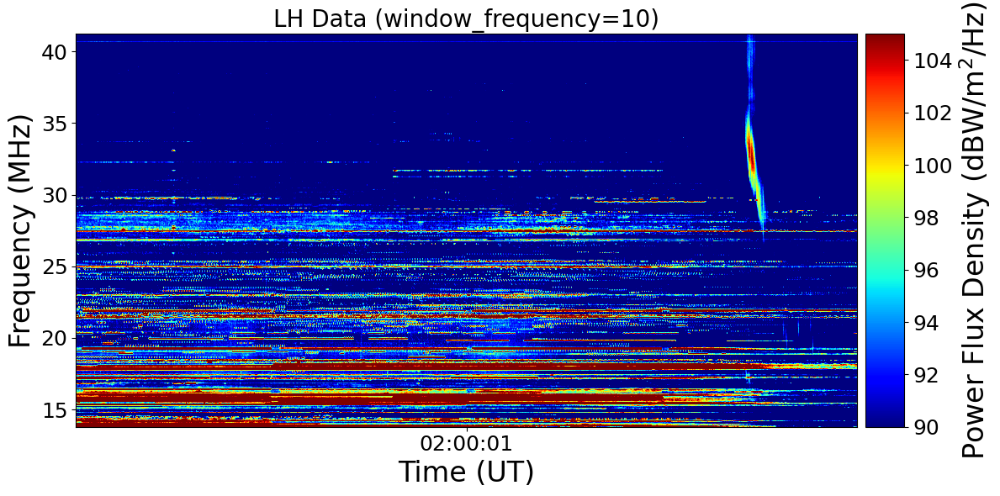

In [5]:


plot_filtered_lh_data(start_time=np.datetime64('2022-06-13T00:00:00'), end_time=np.datetime64('2022-06-13T03:59:59'), title='LH Data (window_frequency=10)', time_interval=60*60*3, frequency_interval=5, window_frequency_size=1)

## 03:10-04:30

start_frequency =  14000000.0
end_frequency =  42000000.0


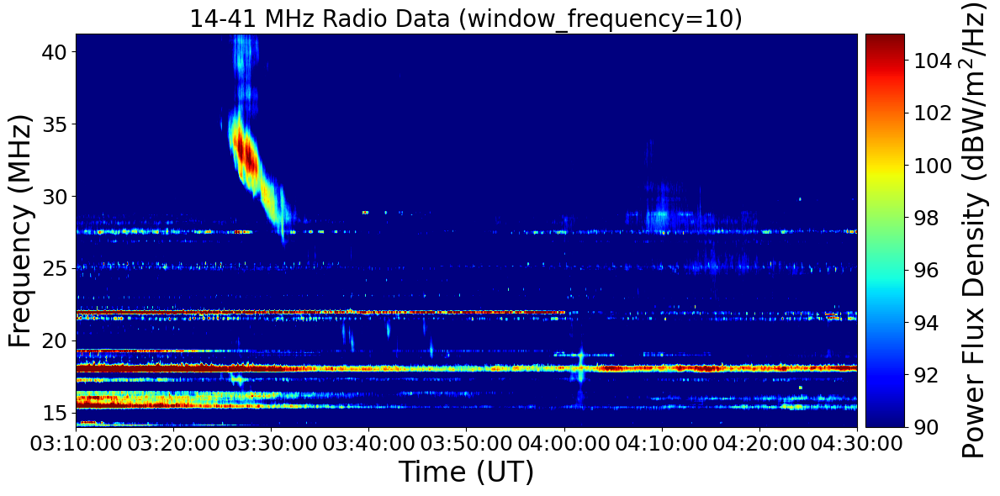

In [124]:
plot_filtered_lh_data(
    start_time=np.datetime64('2022-06-13T03:10:00'),
    end_time=np.datetime64('2022-06-13T04:30:00'),
    title='14-41 MHz Radio Data (window_frequency=10)',
    time_interval=60*10,
    frequency_interval=5
    )

## 03:22-03:50

start_frequency =  0.0
end_frequency = 43000000.0



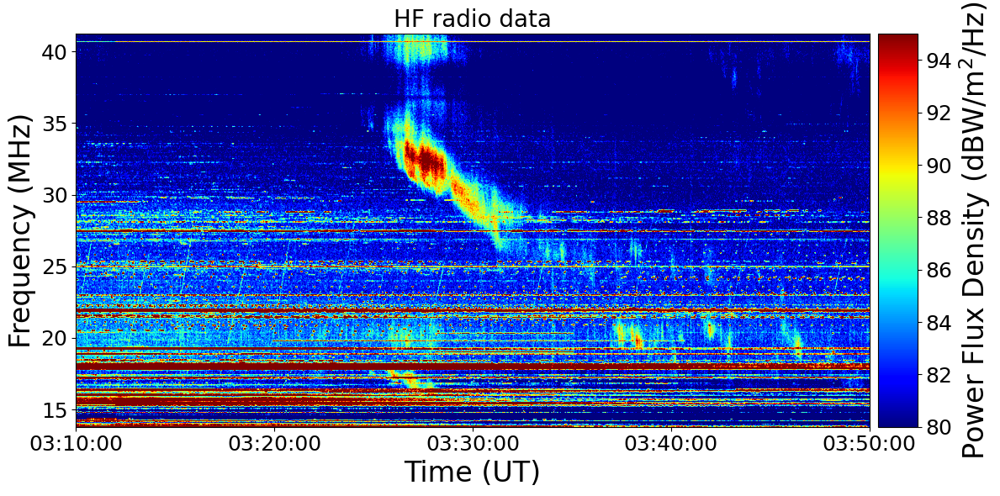

In [79]:
plot_filtered_lh_data(
    start_time=np.datetime64('2022-06-13T03:10:00'),
    end_time=np.datetime64('2022-06-13T03:50:00'),
    title='HF radio data', time_interval=60*10, frequency_interval=5, window_frequency_size=1)

## 03:25-03:33

start_frequency =  25000000.0
end_frequency = 38000000.0



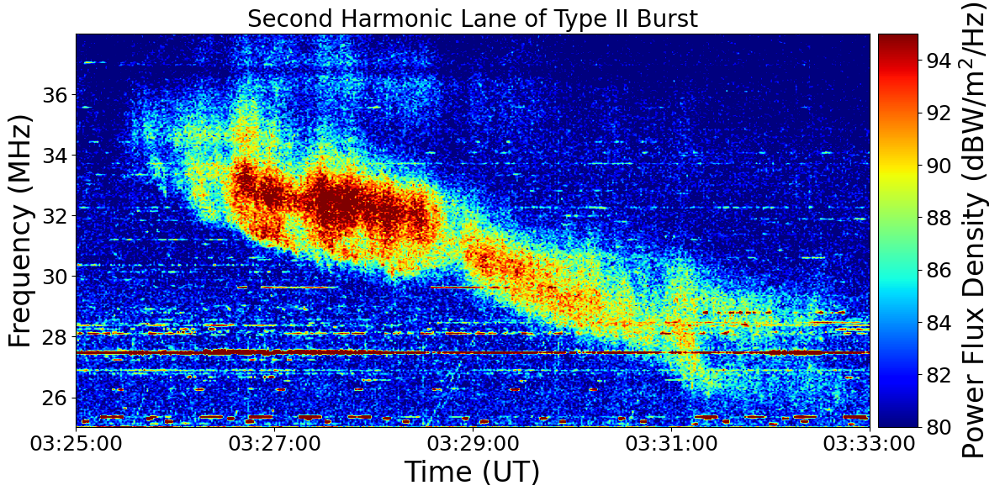

In [81]:
plot_filtered_lh_data(
    start_time=np.datetime64('2022-06-13T03:25:00'),
    end_time=np.datetime64('2022-06-13T03:33:00'),
    title='Second Harmonic Lane of Type II Burst',
    time_interval=60*2,
    frequency_interval=2,
    window_frequency_size=1
    )

バーストに被っている人工ノイズは27.4-27.5MHzと29.6-29.7MHz

### ある強度の閾値を境にプロットを決める

start_frequency [MHz]: 30000000.0
end_frequency [MHz]: 36000000.0


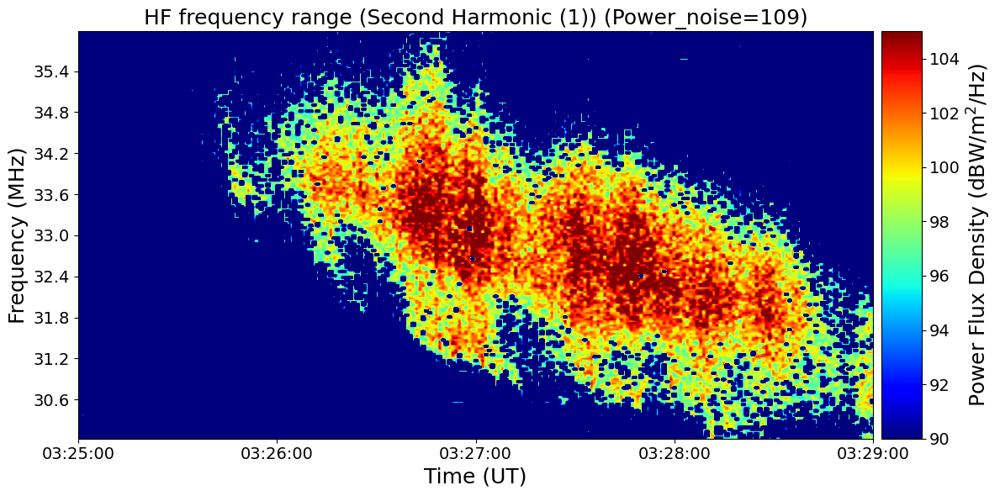

In [85]:
###### スライスしたい時間と周波数の範囲を指定
start_time = np.datetime64('2022-06-13T03:25:00')
end_time = np.datetime64('2022-06-13T03:29:00')

###### ユーザーに周波数範囲を入力してもらう
start_frequency = float(input("min_frequency [MHz] = ")) * 1e6
print('start_frequency [MHz]:', start_frequency)
end_frequency = float(input("MAX_frequency [MHz] = ")) * 1e6
print('end_frequency [MHz]:', end_frequency)

##### カラーバーの範囲を指定
vmin = 90
vmax = 105

###### Epochのスケールを確認して、適切なスケールで時間に変換します
# ミリ秒単位で記録されている
base_time = pd.Timestamp('2022-06-13 00:00:00')
time = base_time + pd.to_timedelta(epoch - epoch[0], unit='ms')

#####################スライス#############################
###### 時間範囲でデータをスライス
time_mask = (time >= start_time) & (time <= end_time)
# if not time_mask.any():
#     raise ValueError("指定された時間範囲にデータが存在しません。")

lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
time_sliced = time[time_mask]  # 時間もスライス

###### 周波数範囲でデータをスライス
freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
# if not freq_mask.any():
#     raise ValueError("指定された周波数範囲にデータが存在しません。")

lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
frequency_sliced = frequency[freq_mask]  # 周波数もスライス
frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換

# Set the threshold for the power flux density
threshold_noise = 109


# Apply the threshold to the sliced data
lh_data_sliced_filtered = np.where(lh_data_sliced <= threshold_noise, lh_data_sliced, 0)  & np.where(96 <= lh_data_sliced, lh_data_sliced, 0)


##########################カラープロットの作成##################################
fig, ax = plt.subplots(figsize=(12, 6))

### カラーバーを図の右側に追加
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)  # sizeはカラーバーの幅, padは間隔

### カラープロットの設定
extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
img = ax.imshow(lh_data_sliced_filtered.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

### カラーバーの追加
cbar = plt.colorbar(img, cax=cax)
cbar.set_label(r'Power Flux Density (dBW/$\rm{m^2}$/Hz)', fontsize=18)
cbar.ax.tick_params(labelsize=14)

### 軸ラベルとタイトル
ax.set_xlabel('Time (UT)', fontsize=18)
ax.set_ylabel('Frequency (MHz)', fontsize=18)
ax.tick_params(axis='both', labelsize=14)

ax.set_title(f'HF frequency range (Second Harmonic (1)) (Power_noise={threshold_noise})', fontsize=18)

### 時間軸のフォーマット設定
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))

### 目盛りを設定
# ax.xaxis.set_major_locator(MaxNLocator(nbins=10))  # x軸の目盛りを10分割
ax.xaxis.set_major_locator(SecondLocator(interval=60))  # 10分ごとに目盛りを追加

ax.yaxis.set_major_locator(MaxNLocator(nbins=10))  # y軸の目盛りを10分割
# y_major_locator = MultipleLocator(1)  # 1MHzごとに目盛を追加
# ax.yaxis.set_major_locator(y_major_locator)


### レイアウトの調整
plt.tight_layout()

### プロットの表示
plt.show()


# 中心周波数をプロット

### 外れ値の除外方法

1. **Zスコア法**

**方法**:
データの平均と標準偏差を用いて、各データ点のZスコア（標準化された値）を計算します。通常、Zスコアが3以上または-3以下のデータを外れ値とみなして除外します。

**メリット**:
簡単で直感的: 統計的手法に基づいており、標準偏差から外れたデータ点を定量的に把握できる。

適用範囲が広い: 正規分布に近いデータに対して効果的。


**デメリット**:
正規分布を仮定している: データが正規分布に従わない場合、Zスコアは適切な外れ値検出方法ではない可能性がある。

小さいサンプルでは効果が低い: 標本数が少ない場合、平均と標準偏差が正確に計算できず、誤った外れ値除去が行われることがある。

## 前半　①

### カラープロット

start_frequency =  29000000.0
end_frequency = 36000000.0



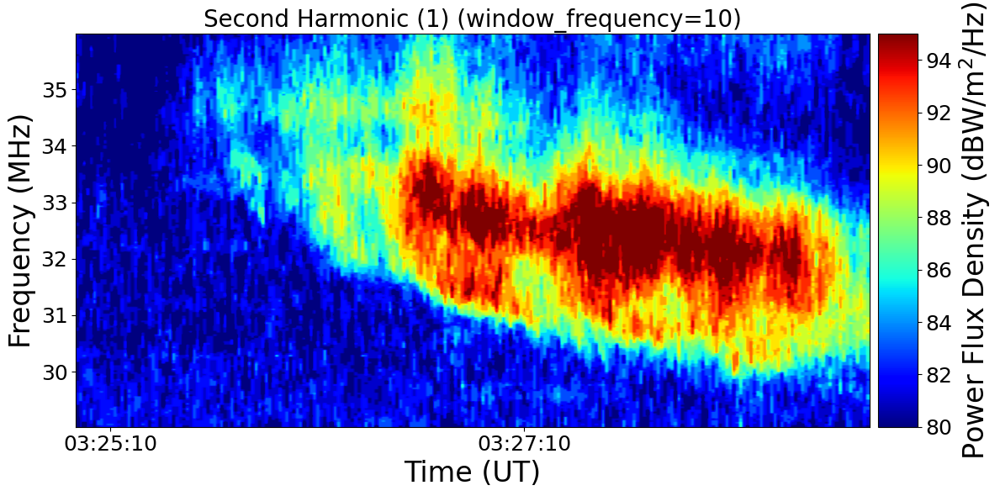

In [93]:
plot_filtered_lh_data(
    start_time=np.datetime64('2022-06-13T03:25:00'),
    end_time=np.datetime64('2022-06-13T03:28:50'),
    title='Second Harmonic (1) (window_frequency=10)',
    time_interval=60*2,
    frequency_interval=1,
    window_frequency_size=10
    )

### window_frequency=10

### window_frequency=1

window_smoothed_line=30, 60

start_frequency = 29.0MHz
end_frequency = 36.0MHz

Slope (MHz/s) [Power>=95]: -8.2521e-03, Intercept: 3.2884e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: 5.2650e-04
Intercept standard deviation (MHz) [Power>=95]: 3.4241e-02 

Slope (MHz/s) [Power>=90]: -1.1151e-02, Intercept: 3.3217e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 4.3903e-04
Intercept standard deviation (MHz) [Power>=90]: 4.0377e-02 

Slope (MHz/s) [Power>=85]: -1.6636e-02, Intercept: 3.4528e+01 MHz
Slope standard deviation (MHz/s) [Power>=85]: 2.9804e-04
Intercept standard deviation (MHz) [Power>=85]: 3.2996e-02 



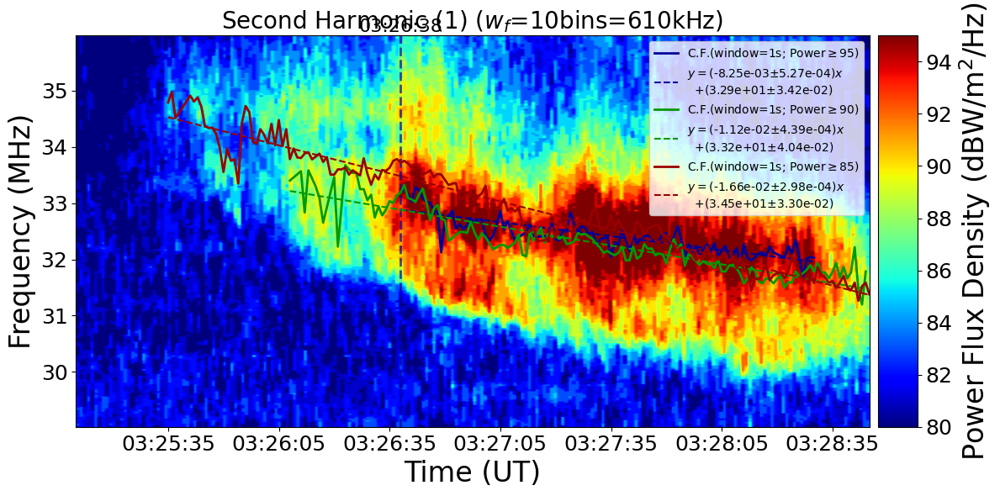

Original center_frequencies (before interpolation): [nan nan nan nan nan nan nan nan nan nan]
Interpolating NaN values in center_frequencies...
Interpolated center_frequencies: [nan nan nan nan nan nan nan nan nan nan]
Filtered center_frequencies: [16.59393311 16.63208008 16.57867432 16.51000977 16.63916397 16.61682129
 16.53919983 16.51477814 16.50238037 16.43371582]
Filtered time_sliced: DatetimeIndex(['2022-06-13 03:26:38', '2022-06-13 03:26:39',
               '2022-06-13 03:26:40', '2022-06-13 03:26:41',
               '2022-06-13 03:26:42', '2022-06-13 03:26:43',
               '2022-06-13 03:26:44', '2022-06-13 03:26:45',
               '2022-06-13 03:26:46', '2022-06-13 03:26:47'],
              dtype='datetime64[ns]', freq=None)
Frequency
slope [Power>=95]:-0.0037278236881562268, intercept [Power>=95]:16.422053319000252

Frequency
slope [Power>=95]:-0.0037278236881562268, intercept [Power>=95]:16.422053319000252

Original center_frequencies (before interpolation): [nan nan nan

In [94]:
plot_filtered_lh_data_center_frequency(
    start_time=np.datetime64('2022-06-13T03:25:10'),
    end_time=np.datetime64('2022-06-13T03:28:45'),
    time_interval=30,  # 30秒ごとに目盛を追加
    frequency_interval=1,  # 1MHzごとに目盛を追加
    window_frequency_size=10, # カラープロットのノイズ消去
    window_smoothed_line=1, # 中心周波数の平滑化
    color_title='Second Harmonic (1) ($w_f$=10bins=610kHz)',
    histo_drift_title=r'Center Frequency drift rate histogram (1) ($\pm 3\sigma$)',
    histo_velocity_title=r'Burst Velocity histogram (1) ($\pm 3\sigma$)',
    burst_velocity_title=r'Burst Velocity-time evolution (1) BA model',
    rho_title=f'Velocity-time evolution (1) BA model',
    density_title=r'Density-Height evolution (1)',
    density_ratio_title=r'Density ratio-time evolution (1)'
)

## 後半

### カラープロット

In [3]:
plot_filtered_lh_data(
    start_time=np.datetime64('2022-06-13T03:28:00'),
    end_time=np.datetime64('2022-06-13T03:33:00'),
    title='Second Harmonic (2) Median filter (window_frequency=10)',
    time_interval=60,
    frequency_interval=1,
    window_frequency_size=10
    )

NameError: name 'plot_filtered_lh_data' is not defined

start_frequency =  26000000.0
end_frequency =  33000000.0


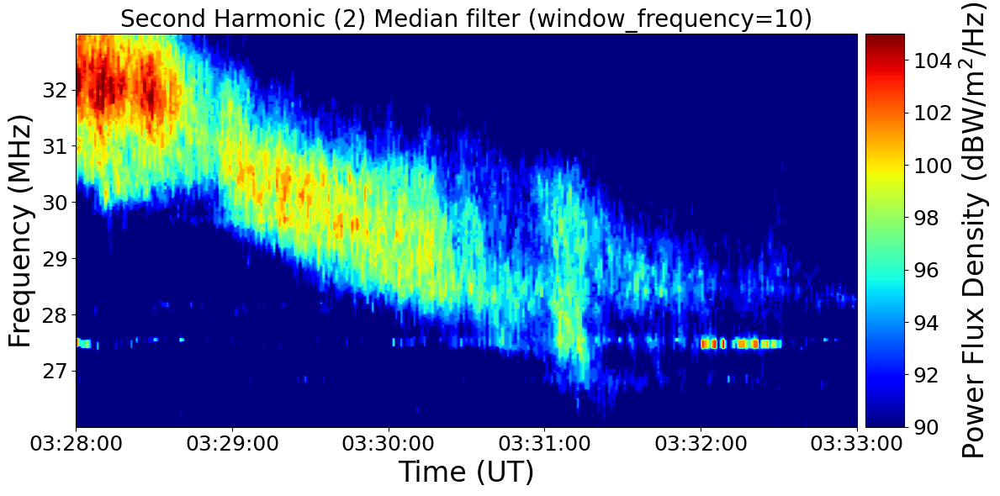

In [21]:
plot_filtered_lh_data(
    start_time=np.datetime64('2022-06-13T03:28:00'),
    end_time=np.datetime64('2022-06-13T03:33:00'),
    title='Second Harmonic (2) Median filter (window_frequency=10)',
    time_interval=60,
    frequency_interval=1,
    window_frequency_size=9
    )

バースト強度は104以下

### 外れ値あり

### 外れ値を除外

### window_frequency=10

window_smoothed_line=1

In [26]:
plot_filtered_lh_data_center_frequency(
    start_time=np.datetime64('2022-06-13T03:28:50'),
    end_time=np.datetime64('2022-06-13T03:30:35'),
    time_interval=30,
    frequency_interval=1,
    window_frequency_size=10,
    window_smoothed_line=1,
    color_title='Second Harmonic (2) Center frequency',
    histo_drift_title=r'Center Frequency drift rate histogram (2) ($\pm 3\sigma$)',
    histo_velocity_title=r'Burst Velocity histogram (2) ($\pm 3\sigma$)',
    histo_rho_title=r'Center Frequency distance histogram (2) ($\pm 3\sigma$)',
    rho_title=f'Distance-time evolution (2) BA model',
    burst_velocity_title=r'Burst Velocity-time evolution (2) BA model',
    
    )

TypeError: plot_filtered_lh_data_center_frequency() got an unexpected keyword argument 'histo_rho_title'

### window_frequency=10

window_smoothed_line=30, 60

start_frequency = 27.799999999999997MHz
end_frequency = 33.0MHz

No valid data for threshold 105, skipping fit.
Slope (MHz/s) [Power>=100]: -2.2121e-02, Intercept: 3.0785e+01 MHz
Slope standard deviation (MHz/s) [Power>=100]: 1.1231e-03
Intercept standard deviation (MHz) [Power>=100]: 5.2749e-02 

Slope (MHz/s) [Power>=95]: -2.1681e-02, Intercept: 3.1064e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: 4.6514e-04
Intercept standard deviation (MHz) [Power>=95]: 3.2293e-02 



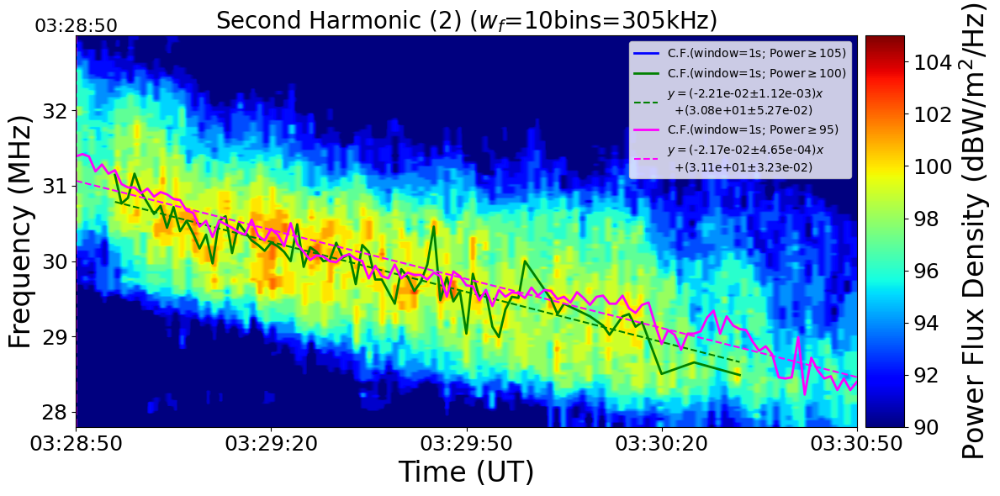

◎ 密度の計算 ◎
density_0_fit: 2937246.593647064
rho_0: 1.9375469514270685
フィットされた多項式: 
-1.425e+07 x + 3.055e+07

polyfit:  
-1.425e+07 x + 3.055e+07
density_0_fit: 2989362.458272448
rho_0: 1.931900428044795
フィットされた多項式: 
-1.395e+07 x + 2.995e+07

polyfit:  
-1.395e+07 x + 2.995e+07


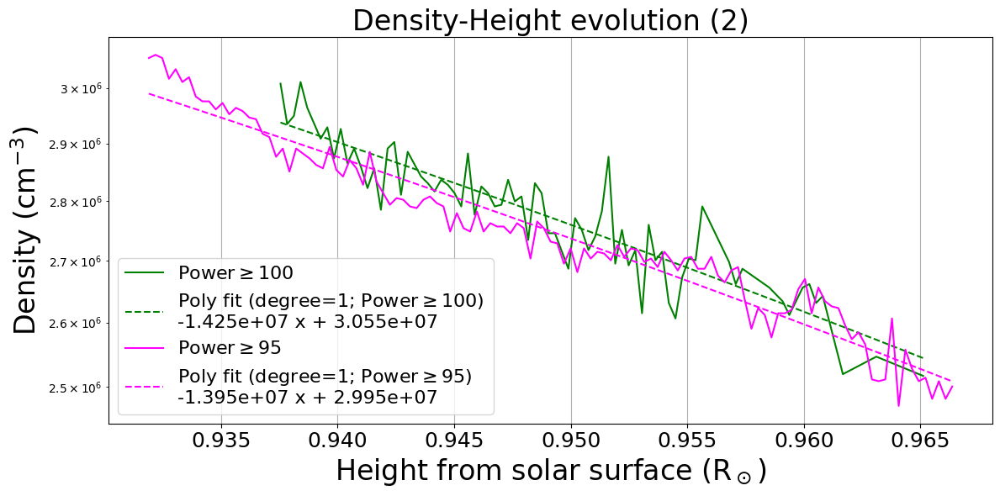

In [ ]:
plot_filtered_lh_data_center_frequency(
    start_time=np.datetime64('2022-06-13T03:28:50'),
    end_time=np.datetime64('2022-06-13T03:30:50'),
    time_interval=30,  # 30秒ごとに目盛を追加
    frequency_interval=1,  # 1MHzごとに目盛を追加
    window_frequency_size=10,
    window_smoothed_line=1,
    color_title='Second Harmonic (2) ($w_f$=10bins=305kHz)',
    histo_drift_title=r'Center Frequency drift rate histogram (2) ($\pm 3\sigma$)',
    histo_velocity_title=r'Burst Velocity histogram (2) ($\pm 3\sigma$)',
    burst_velocity_title=r'Burst Velocity-time evolution (2) BA model',
    rho_title=f'Distance-time evolution (2) BA model',
    density_title=r'Density-Height evolution (2)',
    density_ratio_title=r'Density ratio-time evolution (2)'
    )

start_frequency = 27.0MHz
end_frequency = 33.0MHz

Slope (MHz/s) [Power>=95]: -2.0880e-02, Intercept: 3.0518e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: inf
Intercept standard deviation (MHz) [Power>=95]: inf 

Slope (MHz/s) [Power>=90]: -2.3264e-02, Intercept: 3.0968e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 4.7216e-04
Intercept standard deviation (MHz) [Power>=90]: 3.3818e-02 



/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Slope (MHz/s) [Power>=85]: -1.8712e-02, Intercept: 3.0889e+01 MHz
Slope standard deviation (MHz/s) [Power>=85]: 4.6132e-04
Intercept standard deviation (MHz) [Power>=85]: 3.4691e-02 



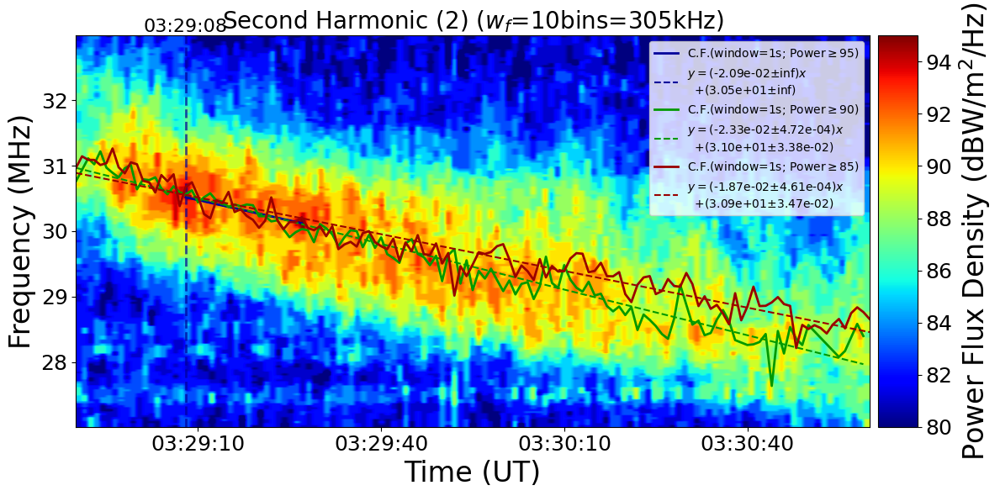

Original center_frequencies (before interpolation): [nan nan nan nan nan nan nan nan nan nan]
Interpolating NaN values in center_frequencies...
Interpolated center_frequencies: [nan nan nan nan nan nan nan nan nan nan]
Filtered center_frequencies: [15.25878906 15.24834884 15.23790861 15.22746839 15.21702817 15.20658794
 15.19614772 15.18570749 15.17526727 15.16482705]
Filtered time_sliced: DatetimeIndex(['2022-06-13 03:29:08', '2022-06-13 03:29:09',
               '2022-06-13 03:29:10', '2022-06-13 03:29:11',
               '2022-06-13 03:29:12', '2022-06-13 03:29:13',
               '2022-06-13 03:29:14', '2022-06-13 03:29:15',
               '2022-06-13 03:29:16', '2022-06-13 03:29:17'],
              dtype='datetime64[ns]', freq=None)
Frequency
slope [Power>=95]:-0.0005134723949870628, intercept [Power>=95]:15.098045795691506

Frequency
slope [Power>=95]:-0.0005134723949870628, intercept [Power>=95]:15.098045795691506

Original center_frequencies (before interpolation): [15.38085938

In [97]:
plot_filtered_lh_data_center_frequency(
    start_time=np.datetime64('2022-06-13T03:28:50'),
    end_time=np.datetime64('2022-06-13T03:31:00'),
    time_interval=30,  # 30秒ごとに目盛を追加
    frequency_interval=1,  # 1MHzごとに目盛を追加
    window_frequency_size=10,
    window_smoothed_line=1,
    color_title='Second Harmonic (2) ($w_f$=10bins=305kHz)',
    histo_drift_title=r'Center Frequency drift rate histogram (2) ($\pm 3\sigma$)',
    histo_velocity_title=r'Burst Velocity histogram (2) ($\pm 3\sigma$)',
    burst_velocity_title=r'Burst Velocity-time evolution (2) BA model',
    rho_title=f'Distance-time evolution (2) BA model',
    density_title=r'Density-Height evolution (2)',
    density_ratio_title=r'Density ratio-time evolution (2)'
    )

# Fundamental

start_frequency =  13000000.0
end_frequency = 18000000.0



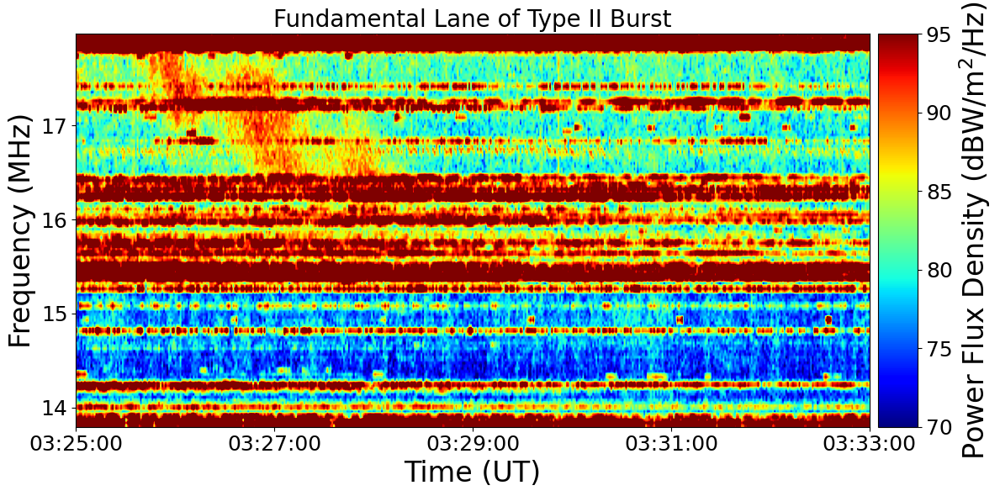

In [85]:
vmin=70
vmax=95
plot_filtered_lh_data(
    start_time=np.datetime64('2022-06-13T03:25:00'),
    end_time=np.datetime64('2022-06-13T03:33:00'),
    title='Fundamental Lane of Type II Burst',
    time_interval=60*2,
    frequency_interval=1,
    window_frequency_size=1
    )

### No outliers

start_frequency [MHz]: 29000000.0
end_frequency [MHz]: 36000000.0


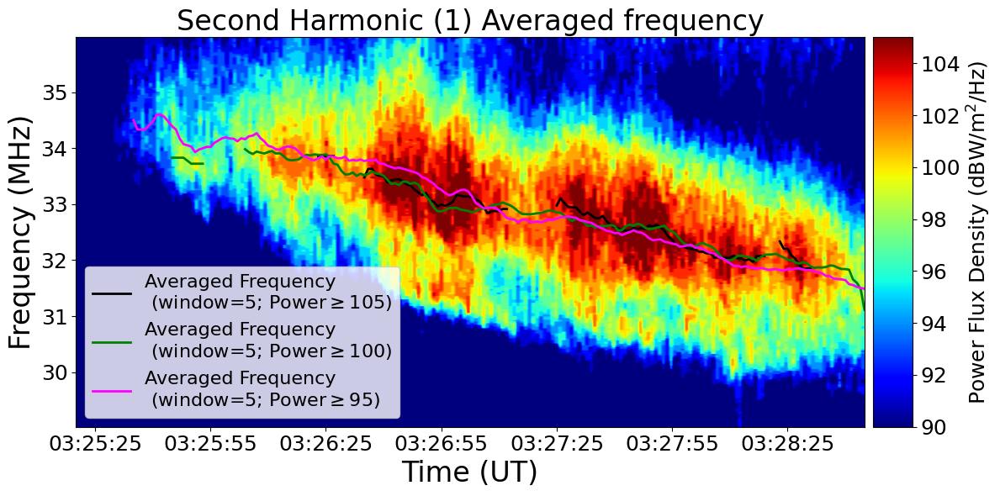

周波数の平均変化率 (average_frequencies): -0.02054913650602984
周波数の平均変化率 (average_frequencies_2): -0.014250332204686862
周波数の平均変化率 (average_frequencies_3): -0.014990804528677343
平均周波数の変化率の平均値: -0.016596757746464682
平均周波数の変化率の標準偏差 (average_frequencies): 0.048249789493378485
平均周波数の変化率の標準偏差 (average_frequencies_2): 0.03826932359507991
平均周波数の変化率の標準偏差 (average_frequencies_3): 0.03472136782230595
標準偏差の平均値: 0.04041349363692145


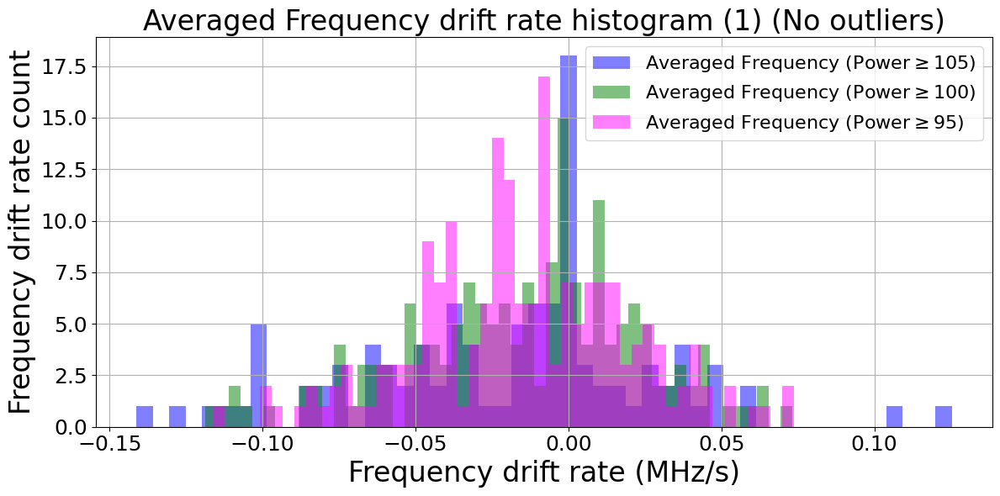

In [104]:

###### スライスしたい時間と周波数の範囲を指定
start_time = np.datetime64('2022-06-13T03:25:20')
end_time = np.datetime64('2022-06-13T03:28:45')


###### ユーザーに周波数範囲を入力してもらう
start_frequency = float(input("min_frequency [MHz] = ")) * 1e6
print('start_frequency [MHz]:', start_frequency)
end_frequency = float(input("MAX_frequency [MHz] = ")) * 1e6
print('end_frequency [MHz]:', end_frequency)

##### カラーバーの範囲を指定
vmin = 90
vmax = 105


###### Epochのスケールを確認して、適切なスケールで時間に変換します
base_time = pd.Timestamp('2022-06-13 00:00:00')
time = base_time + pd.to_timedelta(epoch - epoch[0], unit='ms')




#####################スライス#############################
###### 時間範囲でデータをスライス
time_mask = (time >= start_time) & (time <= end_time)
# if not time_mask.any():
#     raise ValueError("指定された時間範囲にデータが存在しません。")

lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
time_sliced = time[time_mask]  # 時間もスライス


###### 周波数範囲でデータをスライス
freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
# if not freq_mask.any():
#     raise ValueError("指定された周波数範囲にデータが存在しません。")

lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
frequency_sliced = frequency[freq_mask]  # 周波数もスライス
frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換

###### 移動中央値フィルタの適用 (周波数軸に沿って)
# 各時間スライスに対して周波数軸方向にフィルタを適用
window_time_size = 1
window_frequency_size = 10
filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))


######################## 平均周波数の計算 #########################
def find_average_frequencies(v_dim_slice_filtered, freq_bins):
    average_frequencies = []
    for i in range(v_dim_slice_filtered.shape[0]):
        valid_freqs = freq_bins[~np.isnan(v_dim_slice_filtered[i])]
        if len(valid_freqs) > 0:
            average_freq = np.mean(valid_freqs)
            average_frequencies.append(average_freq)
        else:
            average_frequencies.append(np.nan)
    return np.array(average_frequencies)


### 強度の閾値を設定し，中心周波数を求める
threshold = 105
lh_data_sliced_filtered = np.where(filtered_lh_data >= threshold, filtered_lh_data, np.nan)
average_frequencies = find_average_frequencies(lh_data_sliced_filtered, frequency_sliced_mhz)

threshold_2 = 100
lh_data_sliced_filtered_2 = np.where(filtered_lh_data >= threshold_2, filtered_lh_data, np.nan)
average_frequencies_2 = find_average_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz)

threshold_3 = 95
lh_data_sliced_filtered_3 = np.where(filtered_lh_data >= threshold_3, filtered_lh_data, np.nan)
average_frequencies_3 = find_average_frequencies(lh_data_sliced_filtered_3, frequency_sliced_mhz)


### 平滑化された中心周波数
window_size = 5 # 移動平均の数
average_frequencies_smoothed = pd.Series(average_frequencies).rolling(window=window_size, min_periods=1, center=True).mean().to_numpy()

window_size_2 = 5  # 移動平均の数
average_frequencies_smoothed_2 = pd.Series(average_frequencies_2).rolling(window=window_size_2, min_periods=1, center=True).mean().to_numpy()

window_size_3 = 5  # 移動平均の数
average_frequencies_smoothed_3 = pd.Series(average_frequencies_3).rolling(window=window_size_3, min_periods=1, center=True).mean().to_numpy()

########################## プロット ##############################
fig, ax = plt.subplots(figsize=(12, 6))


########### カラープロット###########
### カラーバーを図の右側に追加
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)  # sizeはカラーバーの幅, padは間隔


### カラープロットの設定
extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
img = ax.imshow(filtered_lh_data.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')


### カラーバーの追加
cbar = plt.colorbar(img, cax=cax)
cbar.set_label(r'Power Flux Density (dBW/$\rm{m^2}$/Hz)', fontsize=18)
cbar.ax.tick_params(labelsize=18)


########## ラインプロット ##########
### 平均周波数のプロット
# ax.plot(mdates.date2num(time_sliced), center_frequencies, color='white', linewidth=2, label='Center Frequency')
ax.plot(mdates.date2num(time_sliced), average_frequencies_smoothed, color='black', linewidth=2, label=f'Averaged Frequency \n (window={window_size}; Power$\geq${threshold})')
ax.plot(mdates.date2num(time_sliced), average_frequencies_smoothed_2, color='green', linewidth=2, label=f'Averaged Frequency \n (window={window_size_2}; Power$\geq${threshold_2})')
ax.plot(mdates.date2num(time_sliced), average_frequencies_smoothed_3, color='magenta', linewidth=2, label=f'Averaged Frequency \n (window={window_size_3}; Power$\geq${threshold_3})')

########## その他 ##########
### 軸ラベルとタイトル
ax.set_xlabel('Time (UT)', fontsize=24)
ax.set_ylabel('Frequency (MHz)', fontsize=24)
ax.tick_params(axis='both', labelsize=18)

ax.set_title('Second Harmonic (1) Averaged frequency', fontsize=24)


### 時間軸のフォーマット設定
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))


### 目盛りを設定
# ax.xaxis.set_major_locator(MaxNLocator(nbins=10))  # x軸の目盛りを10分割
ax.xaxis.set_major_locator(SecondLocator(interval=30))

# ax.yaxis.set_major_locator(MaxNLocator(nbins=10))  # y軸の目盛りを10分割
y_major_locator = MultipleLocator(1)  # 1MHzごとに目盛を追加
ax.yaxis.set_major_locator(y_major_locator)

### 凡例の追加
ax.legend(fontsize=16, loc='lower left')

### レイアウトの調整
plt.tight_layout()

### プロットの表示
plt.show()


########################## 平均周波数ドリフトレートの計算 ############################
# 外れ値を除去する関数を定義（Zスコアを用いる）
def remove_outliers(data, threshold=3.0):
    z_scores = zscore(data)
    return data[np.abs(z_scores) < threshold]

# 最小の長さに合わせて配列を揃える
min_length = min(len(average_frequencies_smoothed), len(average_frequencies_smoothed_2), len(average_frequencies_smoothed_3))

average_frequencies_smoothed = average_frequencies_smoothed[:min_length]
average_frequencies_smoothed_2 = average_frequencies_smoothed_2[:min_length]
average_frequencies_smoothed_3 = average_frequencies_smoothed_3[:min_length]
time_sliced = time_sliced[:min_length]

# NaNを無視して有効なデータのみで計算（中心周波数と時間の差分を揃える）
valid_indices_1 = ~np.isnan(average_frequencies_smoothed[:-1])
valid_indices_2 = ~np.isnan(average_frequencies_smoothed_2[:-1])
valid_indices_3 = ~np.isnan(average_frequencies_smoothed_3[:-1])

# 各center_frequenciesに対応する有効な時間データを取得
time_sliced_valid_1 = time_sliced[:-1][valid_indices_1]
time_sliced_valid_2 = time_sliced[:-1][valid_indices_2]
time_sliced_valid_3 = time_sliced[:-1][valid_indices_3]

# 有効な中心周波数データを取得
average_frequencies_valid_1 = average_frequencies_smoothed[:-1][valid_indices_1]
average_frequencies_valid_2 = average_frequencies_smoothed_2[:-1][valid_indices_2]
average_frequencies_valid_3 = average_frequencies_smoothed_3[:-1][valid_indices_3]

# 各周波数の差分を計算
freq_diff_1 = np.diff(average_frequencies_valid_1)
freq_diff_2 = np.diff(average_frequencies_valid_2)
freq_diff_3 = np.diff(average_frequencies_valid_3)

# 外れ値を除外する
freq_diff_1_no_outliers = remove_outliers(freq_diff_1)
freq_diff_2_no_outliers = remove_outliers(freq_diff_2)
freq_diff_3_no_outliers = remove_outliers(freq_diff_3)

# 時間差分の計算（外れ値に対応する時間データも削除）
time_diff_1 = np.diff(time_sliced_valid_1.values).astype('timedelta64[ms]').astype(float) / 1000.0  # 秒に変換
time_diff_2 = np.diff(time_sliced_valid_2.values).astype('timedelta64[ms]').astype(float) / 1000.0  # 秒に変換
time_diff_3 = np.diff(time_sliced_valid_3.values).astype('timedelta64[ms]').astype(float) / 1000.0  # 秒に変換

# 時間差分も外れ値に対応するインデックスを削除
time_diff_1_no_outliers = time_diff_1[:len(freq_diff_1_no_outliers)]
time_diff_2_no_outliers = time_diff_2[:len(freq_diff_2_no_outliers)]
time_diff_3_no_outliers = time_diff_3[:len(freq_diff_3_no_outliers)]

# 周波数の変化率（MHz/秒）を計算
freq_rate_1 = freq_diff_1_no_outliers / time_diff_1_no_outliers
freq_rate_2 = freq_diff_2_no_outliers / time_diff_2_no_outliers
freq_rate_3 = freq_diff_3_no_outliers / time_diff_3_no_outliers

# 各変化率を確認
print("周波数の平均変化率 (average_frequencies):", np.mean(freq_rate_1))
print("周波数の平均変化率 (average_frequencies_2):", np.mean(freq_rate_2))
print("周波数の平均変化率 (average_frequencies_3):", np.mean(freq_rate_3))
print('平均周波数の変化率の平均値:', np.mean([np.mean(freq_rate_1), np.mean(freq_rate_2), np.mean(freq_rate_3)]))
print('平均周波数の変化率の標準偏差 (average_frequencies):', np.std(freq_rate_1))
print('平均周波数の変化率の標準偏差 (average_frequencies_2):', np.std(freq_rate_2))
print('平均周波数の変化率の標準偏差 (average_frequencies_3):', np.std(freq_rate_3))
print('標準偏差の平均値:', np.mean([np.std(freq_rate_1), np.std(freq_rate_2), np.std(freq_rate_3)]))


# 周波数の変化率のヒストグラム
fig, ax = plt.subplots(figsize=(12, 6))
ax.hist(freq_rate_1, bins=50, alpha=0.5, label=f'Averaged Frequency (Power$\geq${threshold})', color='blue')
ax.hist(freq_rate_2, bins=50, alpha=0.5, label=f'Averaged Frequency (Power$\geq${threshold_2})', color='green')
ax.hist(freq_rate_3, bins=50, alpha=0.5, label=f'Averaged Frequency (Power$\geq${threshold_3})', color='magenta')
ax.set_xlabel('Frequency drift rate (MHz/s)', fontsize=24)
ax.set_ylabel('Frequency drift rate count', fontsize=24)
ax.tick_params(axis='both', labelsize=18)
ax.title.set_text('Averaged Frequency drift rate histogram (1) (No outliers)')
ax.title.set_fontsize(24)
ax.legend(fontsize=16, loc='best')
ax.grid()
plt.tight_layout()
plt.show()


## 後半

start_frequency [MHz]: 26000000.0
end_frequency [MHz]: 33000000.0


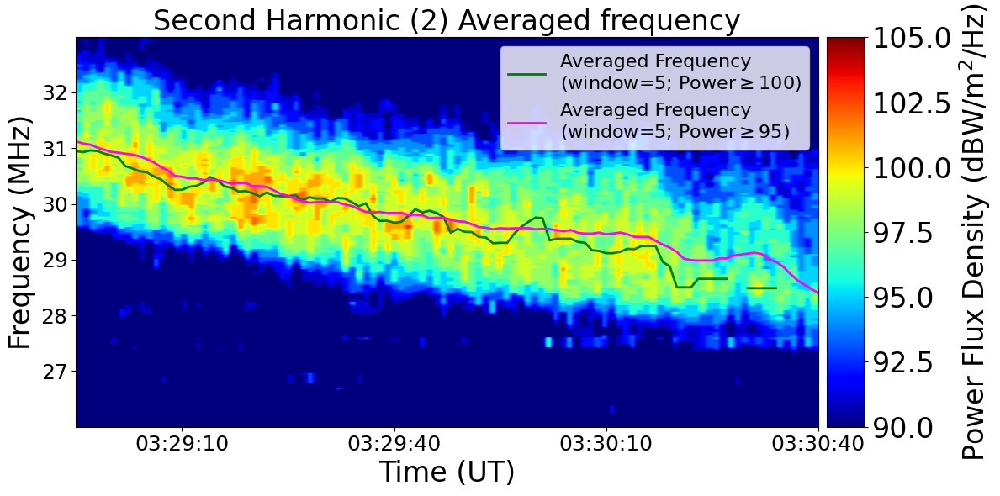

周波数の平均変化率 (average_frequencies_2): -0.02420431969501718
周波数の平均変化率 (average_frequencies_3): -0.025449327933482646
平均周波数の変化率の平均値: -0.024826823814249915
各平均周波数の変化率の標準偏差 (average_frequencies_2): 0.09030117234641086
各平均周波数の変化率の標準偏差 (average_frequencies_3): 0.03414386203217625
標準偏差の平均値: 0.06222251718929356


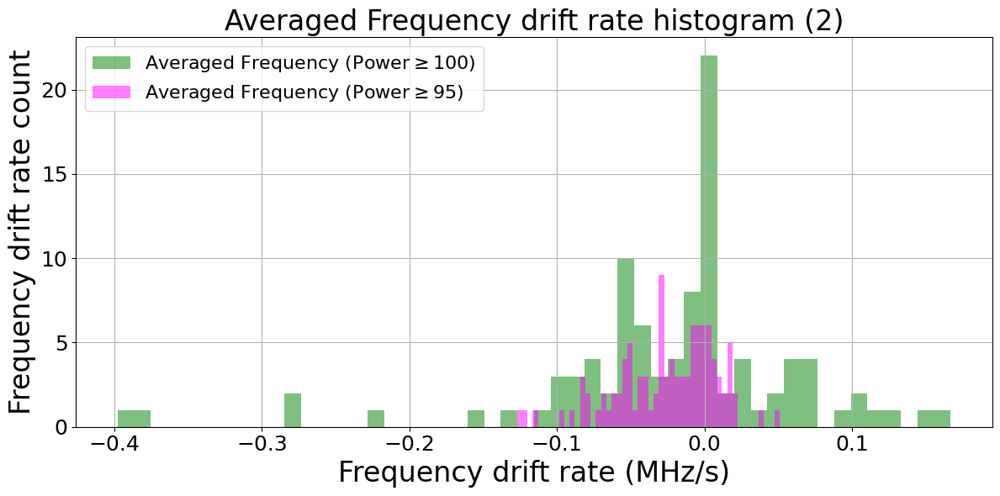

In [95]:
###### スライスしたい時間と周波数の範囲を指定
start_time = np.datetime64('2022-06-13T03:28:55')
end_time = np.datetime64('2022-06-13T03:30:40')


###### ユーザーに周波数範囲を入力してもらう
start_frequency = float(input("min_frequency [MHz] = ")) * 1e6
print('start_frequency [MHz]:', start_frequency)
end_frequency = float(input("MAX_frequency [MHz] = ")) * 1e6
print('end_frequency [MHz]:', end_frequency)

##### カラーバーの範囲を指定
vmin = 90
vmax = 105


###### Epochのスケールを確認して、適切なスケールで時間に変換します
base_time = pd.Timestamp('2022-06-13 00:00:00')
time = base_time + pd.to_timedelta(epoch - epoch[0], unit='ms')




#####################スライス#############################
###### 時間範囲でデータをスライス
time_mask = (time >= start_time) & (time <= end_time)
# if not time_mask.any():
#     raise ValueError("指定された時間範囲にデータが存在しません。")

lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
time_sliced = time[time_mask]  # 時間もスライス


###### 周波数範囲でデータをスライス
freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
# if not freq_mask.any():
#     raise ValueError("指定された周波数範囲にデータが存在しません。")

lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
frequency_sliced = frequency[freq_mask]  # 周波数もスライス
frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換


###### 移動中央値フィルタの適用 (周波数軸に沿って)
# 各時間スライスに対して周波数軸方向にフィルタを適用
window_time_size = 1
window_frequency_size = 10
filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))


######################### 平均周波数の計算 ##########################
def find_average_frequencies(v_dim_slice_filtered, freq_bins):
    average_frequencies = []
    for i in range(v_dim_slice_filtered.shape[0]):
        valid_freqs = freq_bins[~np.isnan(v_dim_slice_filtered[i])]
        if len(valid_freqs) > 0:
            average_freq = np.mean(valid_freqs)
            average_frequencies.append(average_freq)
        else:
            average_frequencies.append(np.nan)
    return np.array(average_frequencies)


### 強度の閾値を設定し，中心周波数を求める

threshold_max = 104

threshold_2 = 100
lh_data_sliced_filtered_2 = np.where(
    np.logical_and(threshold_2 <= filtered_lh_data, filtered_lh_data <= threshold_max),
    filtered_lh_data,
    np.nan)
average_frequencies_2 = find_average_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz)

threshold_3 = 95
lh_data_sliced_filtered_3 = np.where(
    np.logical_and(threshold_3 <= filtered_lh_data, filtered_lh_data <= threshold_max),
    lh_data_sliced,
    np.nan)
average_frequencies_3 = find_average_frequencies(lh_data_sliced_filtered_3, frequency_sliced_mhz)


### 平滑化された中心周波数`
window_size_2 = 5  # 移動平均の数
average_frequencies_smoothed_2 = pd.Series(average_frequencies_2).rolling(window=window_size_2, min_periods=1, center=True).mean().to_numpy()

window_size_3 = 5  # 移動平均の数
average_frequencies_smoothed_3 = pd.Series(average_frequencies_3).rolling(window=window_size_3, min_periods=1, center=True).mean().to_numpy()

########################## プロット ##############################
fig, ax = plt.subplots(figsize=(12, 6))


########### カラープロット###########
### カラーバーを図の右側に追加
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)  # sizeはカラーバーの幅, padは間隔


### カラープロットの設定
extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
img = ax.imshow(filtered_lh_data.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')


### カラーバーの追加
cbar = plt.colorbar(img, cax=cax)
cbar.set_label(r'Power Flux Density (dBW/$\rm{m^2}$/Hz)', fontsize=24)
cbar.ax.tick_params(labelsize=24)


########## ラインプロット ##########
### 中心周波数のプロット
ax.plot(mdates.date2num(time_sliced), average_frequencies_smoothed_2, color='green', linewidth=2, label=f'Averaged Frequency\n(window={window_size_2}; Power$\geq${threshold_2})')
ax.plot(mdates.date2num(time_sliced), average_frequencies_smoothed_3, color='magenta', linewidth=2, label=f'Averaged Frequency\n(window={window_size_3}; Power$\geq${threshold_3})')

########## その他 ##########
### 軸ラベルとタイトル
ax.set_xlabel('Time (UT)', fontsize=24)
ax.set_ylabel('Frequency (MHz)', fontsize=24)
ax.tick_params(axis='both', labelsize=18)

ax.set_title('Second Harmonic (2) Averaged frequency', fontsize=24)


### 時間軸のフォーマット設定
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))


### 目盛りを設定
# ax.xaxis.set_major_locator(MaxNLocator(nbins=10))  # x軸の目盛りを10分割
ax.xaxis.set_major_locator(SecondLocator(interval=30))

# ax.yaxis.set_major_locator(MaxNLocator(nbins=10))  # y軸の目盛りを10分割
y_major_locator = MultipleLocator(1)  # 1MHzごとに目盛を追加
ax.yaxis.set_major_locator(y_major_locator)


### 凡例の追加
ax.legend(fontsize=16, loc='best')


### レイアウトの調整
plt.tight_layout()



### プロットの表示
plt.show()


########################## 平均周波数ドリフトレートの計算 ############################
# 最小の長さに合わせて配列を揃える
min_length = min(len(average_frequencies_smoothed), len(average_frequencies_smoothed_2), len(average_frequencies_smoothed_3))


average_frequencies_smoothed_2 = average_frequencies_smoothed_2[:min_length]
average_frequencies_smoothed_3 = average_frequencies_smoothed_3[:min_length]
time_sliced = time_sliced[:min_length]


# NaNを無視して有効なデータのみで計算（中心周波数と時間の差分を揃える）
# 各average_frequenciesごとに有効なインデックスを取得し、それに対応する時間差分を計算します

# average_frequencies_2の差分と対応する時間差分
valid_indices_2 = ~np.isnan(average_frequencies_smoothed_2[:-1])
time_sliced_valid_2 = time_sliced[:-1][valid_indices_2]
average_frequencies_valid_2 = average_frequencies_smoothed_2[:-1][valid_indices_2]
time_diff_2 = np.diff(time_sliced_valid_2.values).astype('timedelta64[ms]').astype(float) / 1000.0  # 秒に変換

# average_frequencies_3の差分と対応する時間差分
valid_indices_3 = ~np.isnan(average_frequencies_smoothed_3[:-1])
time_sliced_valid_3 = time_sliced[:-1][valid_indices_3]
average_frequencies_valid_3 = average_frequencies_smoothed_3[:-1][valid_indices_3]
time_diff_3 = np.diff(time_sliced_valid_3.values).astype('timedelta64[ms]').astype(float) / 1000.0  # 秒に変換

# 各average_frequenciesの時間差分と周波数差分を計算
freq_diff_2 = np.diff(average_frequencies_valid_2)
freq_diff_3 = np.diff(average_frequencies_valid_3)

# 周波数の変化率（MHz/秒）
freq_rate_2 = freq_diff_2 / time_diff_2
freq_rate_3 = freq_diff_3 / time_diff_3

# 各変化率を確認
print("周波数の平均変化率 (average_frequencies_2):", np.mean(freq_rate_2))
print("周波数の平均変化率 (average_frequencies_3):", np.mean(freq_rate_3))
print('平均周波数の変化率の平均値:', np.mean([np.mean(freq_rate_2), np.mean(freq_rate_3)]))
print('各平均周波数の変化率の標準偏差 (average_frequencies_2):', np.std(freq_rate_2))
print('各平均周波数の変化率の標準偏差 (average_frequencies_3):', np.std(freq_rate_3))
print('標準偏差の平均値:', np.mean([np.std(freq_rate_2), np.std(freq_rate_3)]))


# 周波数の変化率のヒストグラム
fig, ax = plt.subplots(figsize=(12, 6))
ax.hist(freq_rate_2, bins=50, alpha=0.5, label=f'Averaged Frequency (Power$\geq${threshold_2})', color='green')
ax.hist(freq_rate_3, bins=50, alpha=0.5, label=f'Averaged Frequency (Power$\geq${threshold_3})', color='magenta')
ax.set_xlabel('Frequency drift rate (MHz/s)', fontsize=24)
ax.set_ylabel('Frequency drift rate count', fontsize=24)
ax.tick_params(axis='both', labelsize=18)
ax.legend(fontsize=16, loc='best')
ax.title.set_text('Averaged Frequency drift rate histogram (2)')
ax.title.set_fontsize(24)
ax.grid()
plt.tight_layout()
plt.show()


### No outliers

start_frequency [MHz]: 26000000.0
end_frequency [MHz]: 33000000.0


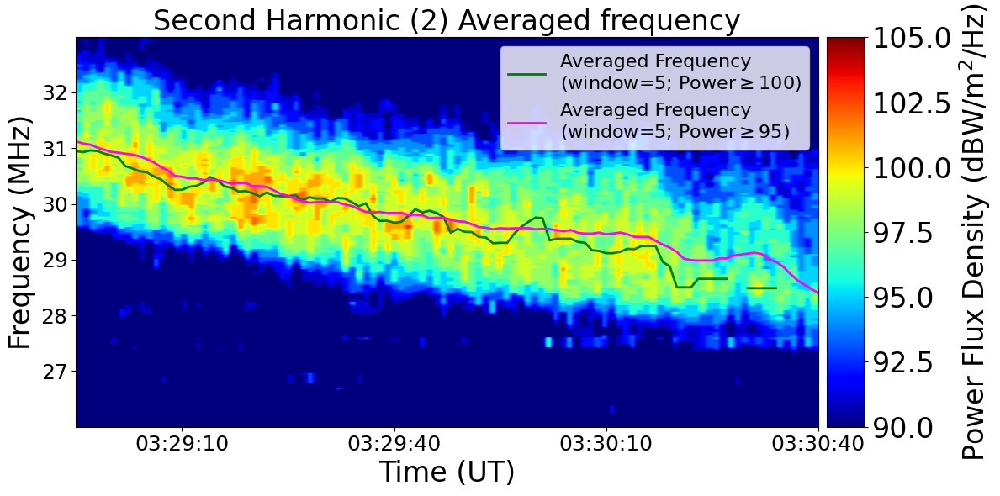

周波数の平均変化率 (average_frequencies_2): -0.017746483652215254
周波数の平均変化率 (average_frequencies_3): -0.025449327933482646
平均周波数の変化率の平均値: -0.02159790579284895
各平均周波数の変化率の標準偏差 (average_frequencies_2): 0.07562352409726318
各平均周波数の変化率の標準偏差 (average_frequencies_3): 0.03414386203217625
標準偏差の平均値: 0.05488369306471971


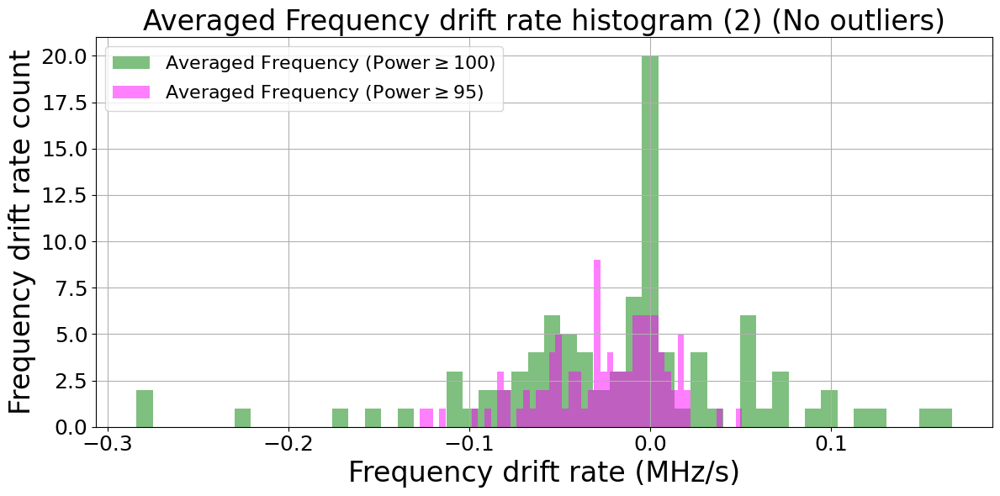

In [106]:
###### スライスしたい時間と周波数の範囲を指定
start_time = np.datetime64('2022-06-13T03:28:55')
end_time = np.datetime64('2022-06-13T03:30:40')


###### ユーザーに周波数範囲を入力してもらう
start_frequency = float(input("min_frequency [MHz] = ")) * 1e6
print('start_frequency [MHz]:', start_frequency)
end_frequency = float(input("MAX_frequency [MHz] = ")) * 1e6
print('end_frequency [MHz]:', end_frequency)

##### カラーバーの範囲を指定
vmin = 90
vmax = 105


###### Epochのスケールを確認して、適切なスケールで時間に変換します
base_time = pd.Timestamp('2022-06-13 00:00:00')
time = base_time + pd.to_timedelta(epoch - epoch[0], unit='ms')




#####################スライス#############################
###### 時間範囲でデータをスライス
time_mask = (time >= start_time) & (time <= end_time)
# if not time_mask.any():
#     raise ValueError("指定された時間範囲にデータが存在しません。")

lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
time_sliced = time[time_mask]  # 時間もスライス


###### 周波数範囲でデータをスライス
freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
# if not freq_mask.any():
#     raise ValueError("指定された周波数範囲にデータが存在しません。")

lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
frequency_sliced = frequency[freq_mask]  # 周波数もスライス
frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換


###### 移動中央値フィルタの適用 (周波数軸に沿って)
# 各時間スライスに対して周波数軸方向にフィルタを適用
window_time_size = 1
window_frequency_size = 10
filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))


######################### 平均周波数の計算 ##########################
def find_average_frequencies(v_dim_slice_filtered, freq_bins):
    average_frequencies = []
    for i in range(v_dim_slice_filtered.shape[0]):
        valid_freqs = freq_bins[~np.isnan(v_dim_slice_filtered[i])]
        if len(valid_freqs) > 0:
            average_freq = np.mean(valid_freqs)
            average_frequencies.append(average_freq)
        else:
            average_frequencies.append(np.nan)
    return np.array(average_frequencies)


### 強度の閾値を設定し，中心周波数を求める

threshold_max = 104

threshold_2 = 100
lh_data_sliced_filtered_2 = np.where(
    np.logical_and(threshold_2 <= filtered_lh_data, filtered_lh_data <= threshold_max),
    filtered_lh_data,
    np.nan)
average_frequencies_2 = find_average_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz)

threshold_3 = 95
lh_data_sliced_filtered_3 = np.where(
    np.logical_and(threshold_3 <= filtered_lh_data, filtered_lh_data <= threshold_max),
    lh_data_sliced,
    np.nan)
average_frequencies_3 = find_average_frequencies(lh_data_sliced_filtered_3, frequency_sliced_mhz)


### 平滑化された中心周波数`
window_size_2 = 5  # 移動平均の数
average_frequencies_smoothed_2 = pd.Series(average_frequencies_2).rolling(window=window_size_2, min_periods=1, center=True).mean().to_numpy()

window_size_3 = 5  # 移動平均の数
average_frequencies_smoothed_3 = pd.Series(average_frequencies_3).rolling(window=window_size_3, min_periods=1, center=True).mean().to_numpy()

########################## プロット ##############################
fig, ax = plt.subplots(figsize=(12, 6))


########### カラープロット###########
### カラーバーを図の右側に追加
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)  # sizeはカラーバーの幅, padは間隔


### カラープロットの設定
extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
img = ax.imshow(filtered_lh_data.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')


### カラーバーの追加
cbar = plt.colorbar(img, cax=cax)
cbar.set_label(r'Power Flux Density (dBW/$\rm{m^2}$/Hz)', fontsize=24)
cbar.ax.tick_params(labelsize=24)


########## ラインプロット ##########
### 中心周波数のプロット
ax.plot(mdates.date2num(time_sliced), average_frequencies_smoothed_2, color='green', linewidth=2, label=f'Averaged Frequency\n(window={window_size_2}; Power$\geq${threshold_2})')
ax.plot(mdates.date2num(time_sliced), average_frequencies_smoothed_3, color='magenta', linewidth=2, label=f'Averaged Frequency\n(window={window_size_3}; Power$\geq${threshold_3})')

########## その他 ##########
### 軸ラベルとタイトル
ax.set_xlabel('Time (UT)', fontsize=24)
ax.set_ylabel('Frequency (MHz)', fontsize=24)
ax.tick_params(axis='both', labelsize=18)

ax.set_title('Second Harmonic (2) Averaged frequency', fontsize=24)


### 時間軸のフォーマット設定
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))


### 目盛りを設定
# ax.xaxis.set_major_locator(MaxNLocator(nbins=10))  # x軸の目盛りを10分割
ax.xaxis.set_major_locator(SecondLocator(interval=30))

# ax.yaxis.set_major_locator(MaxNLocator(nbins=10))  # y軸の目盛りを10分割
y_major_locator = MultipleLocator(1)  # 1MHzごとに目盛を追加
ax.yaxis.set_major_locator(y_major_locator)


### 凡例の追加
ax.legend(fontsize=16, loc='best')


### レイアウトの調整
plt.tight_layout()



### プロットの表示
plt.show()


########################## 平均周波数ドリフトレートの計算 ############################
# 外れ値を除去する関数を定義（Zスコアを用いる）
def remove_outliers(data, threshold=3.0):
    z_scores = zscore(data)
    return data[np.abs(z_scores) < threshold]

# 最小の長さに合わせて配列を揃える
min_length = min(len(average_frequencies_smoothed_2), len(average_frequencies_smoothed_3))

average_frequencies_smoothed_2 = average_frequencies_smoothed_2[:min_length]
average_frequencies_smoothed_3 = average_frequencies_smoothed_3[:min_length]
time_sliced = time_sliced[:min_length]

# NaNを無視して有効なデータのみで計算（中心周波数と時間の差分を揃える）
valid_indices_2 = ~np.isnan(average_frequencies_smoothed_2[:-1])
valid_indices_3 = ~np.isnan(average_frequencies_smoothed_3[:-1])

# 各center_frequenciesに対応する有効な時間データを取得
time_sliced_valid_2 = time_sliced[:-1][valid_indices_2]
time_sliced_valid_3 = time_sliced[:-1][valid_indices_3]

# 有効な中心周波数データを取得
average_frequencies_valid_2 = average_frequencies_smoothed_2[:-1][valid_indices_2]
average_frequencies_valid_3 = average_frequencies_smoothed_3[:-1][valid_indices_3]

# 各周波数の差分を計算
freq_diff_2 = np.diff(average_frequencies_valid_2)
freq_diff_3 = np.diff(average_frequencies_valid_3)

# 外れ値を除外する
freq_diff_2_no_outliers = remove_outliers(freq_diff_2)
freq_diff_3_no_outliers = remove_outliers(freq_diff_3)

# 時間差分の計算（外れ値に対応する時間データも削除）
time_diff_2 = np.diff(time_sliced_valid_2.values).astype('timedelta64[ms]').astype(float) / 1000.0  # 秒に変換
time_diff_3 = np.diff(time_sliced_valid_3.values).astype('timedelta64[ms]').astype(float) / 1000.0  # 秒に変換

# 時間差分も外れ値に対応するインデックスを削除
time_diff_2_no_outliers = time_diff_2[:len(freq_diff_2_no_outliers)]
time_diff_3_no_outliers = time_diff_3[:len(freq_diff_3_no_outliers)]

# 周波数の変化率（MHz/秒）を計算
freq_rate_2 = freq_diff_2_no_outliers / time_diff_2_no_outliers
freq_rate_3 = freq_diff_3_no_outliers / time_diff_3_no_outliers

# 各変化率を確認
print("周波数の平均変化率 (average_frequencies_2):", np.mean(freq_rate_2))
print("周波数の平均変化率 (average_frequencies_3):", np.mean(freq_rate_3))
print('平均周波数の変化率の平均値:', np.mean([np.mean(freq_rate_2), np.mean(freq_rate_3)]))
print('各平均周波数の変化率の標準偏差 (average_frequencies_2):', np.std(freq_rate_2))
print('各平均周波数の変化率の標準偏差 (average_frequencies_3):', np.std(freq_rate_3))
print('標準偏差の平均値:', np.mean([np.std(freq_rate_2), np.std(freq_rate_3)]))


# 周波数の変化率のヒストグラム
fig, ax = plt.subplots(figsize=(12, 6))
ax.hist(freq_rate_2, bins=50, alpha=0.5, label=f'Averaged Frequency (Power$\geq${threshold_2})', color='green')
ax.hist(freq_rate_3, bins=50, alpha=0.5, label=f'Averaged Frequency (Power$\geq${threshold_3})', color='magenta')
ax.set_xlabel('Frequency drift rate (MHz/s)', fontsize=24)
ax.set_ylabel('Frequency drift rate count', fontsize=24)
ax.tick_params(axis='both', labelsize=18)
ax.legend(fontsize=16, loc='best')
ax.title.set_text('Averaged Frequency drift rate histogram (2) (No outliers)')
ax.title.set_fontsize(24)
ax.grid()
plt.tight_layout()
plt.show()


# 前半+後半

## 全体

start_frequency =  25000000.0
end_frequency = 37000000.0



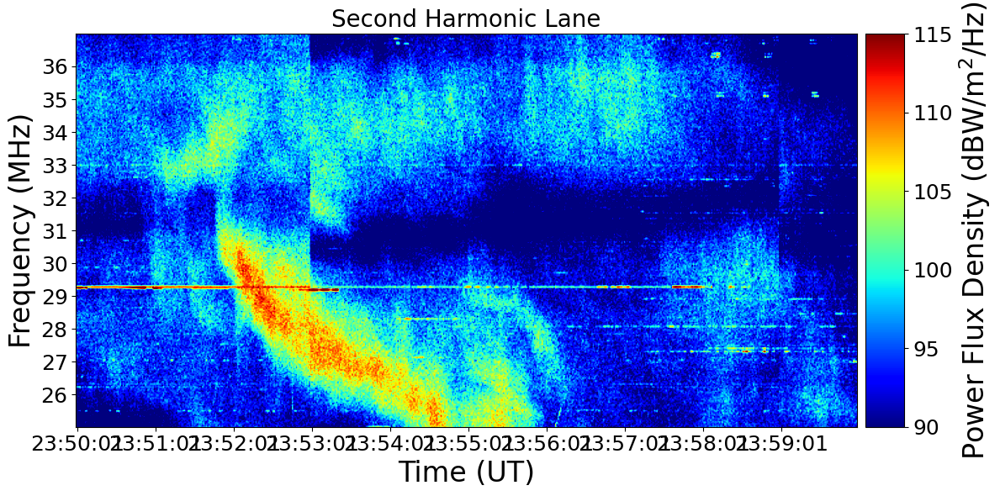

In [28]:
vmin=90
vmax=115
plot_filtered_lh_data(start_time=np.datetime64('2024-06-21T23:50:00'),
    end_time=np.datetime64('2024-06-21T23:59:59'),
    title='Second Harmonic Lane',
    time_interval=60*1,
    frequency_interval=1,
    window_frequency_size=1
    )

前半：start_time=np.datetime64('2022-06-13T03:25:20'), end_time=np.datetime64('2022-06-13T03:28:45')

後半：start_time=np.datetime64('2022-06-13T03:28:50'), end_time=np.datetime64('2022-06-13T03:30:50')

## 関数

### ラインプロットひとまとめ

In [10]:
def plot_second_harmonic_lane(color_title):
    def initial_settings(start_time, end_time, max_frequency, min_frequency):
        
        start_frequency = min_frequency
        end_frequency = max_frequency
        
        ##################### スライス #############################
        # 時間範囲でデータをスライス
        time_mask = (time >= start_time) & (time <= end_time)
        lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
        time_sliced = time[time_mask]  # 時間もスライス

        # 周波数範囲でデータをスライス
        freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
        lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
        frequency_sliced = frequency[freq_mask]  # 周波数もスライス
        frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換

        # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
        window_time_size = 1
        window_frequency_size = 5
        filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))
        
        return time_sliced, filtered_lh_data, frequency_sliced_mhz
    
    
    ########################################################################
    ################## スペクトル ##################
    start_time_spectrum = np.datetime64('2022-06-13T03:25:10')
    end_time_spectrum = np.datetime64('2022-06-13T03:33:00')
    
    max_frequency_spectrum = 37e6
    min_frequency_spectrum = 26e6
    
    time_sliced_spectrum, filtered_lh_data_spectrum, frequency_sliced_mhz_spectrum = initial_settings(start_time_spectrum, end_time_spectrum, max_frequency_spectrum, min_frequency_spectrum)    
    
    
    #########################################################################
    ##################　前半 ##################
    start_time_1 = np.datetime64('2022-06-13T03:25:20')
    end_time_1 = np.datetime64('2022-06-13T03:28:50')
    
    max_frequency_1 = 36.1e6
    min_frequency_1 = 29.5e6
    
    time_sliced_1, filtered_lh_data_1, frequency_sliced_mhz_1 = initial_settings(start_time_1, end_time_1, max_frequency_1, min_frequency_1)
    
    
    #########################################################################
    ##################　後半 ##################
    start_time_2 = np.datetime64('2022-06-13T03:28:50')
    end_time_2 = np.datetime64('2022-06-13T03:31:20')
    
    start_frequency_2 = 33e6
    end_frequency_2 = 26e6
    
    time_sliced_2, filtered_lh_data_2, frequency_sliced_mhz_2 = initial_settings(start_time_2, end_time_2, start_frequency_2, end_frequency_2)
    
    ######################################################################
    ########################## ax1 ###############################################
    ##################　カラープロット ##################
    fig, axes = plt.subplots(2,1,figsize=(12, 12), sharex=True, sharey=False)
    
    ###################################
    ax = axes[0]

    # カラーバーを図の右側に追加
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)  # sizeはカラーバーの幅, padは間隔

    # カラープロットの設定
    extent = [mdates.date2num(time_sliced_spectrum[0]), mdates.date2num(time_sliced_spectrum[-1]), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1]]
    img = ax.imshow(filtered_lh_data_spectrum.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

    # カラーバーの追加
    cbar = plt.colorbar(img, cax=cax)
    cbar.set_label(r'Power Flux Density (dBW/$\rm{m^2}$/Hz)', fontsize=24)
    cbar.ax.tick_params(labelsize=18)

    # 軸ラベルとタイトル
    # ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='both', labelsize=18)
    ax.set_title(color_title, fontsize=20)

    # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time_spectrum)), mdates.date2num(np.datetime64(end_time_spectrum)))

    # 目盛りを設定
    ax.xaxis.set_major_locator(SecondLocator(interval=60*1))  # 時間軸
    y_major_locator = MultipleLocator(1)  # 周波数軸
    ax.yaxis.set_major_locator(y_major_locator)
    
    
    
    #########################################################################
    ################## 前半 ##################
        # 閾値ごとの中心周波数計算
    for threshold, color in zip(thresholds, colors):
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        # center_frequency_line_plot(ax, time_sliced_1, smoothed_frequencies_1, 1, threshold, color, 'C.F.')
        center_frequency_label = f'Power$\geq${threshold}'
        fit_line_to_center_frequencies(ax, time_sliced_1, smoothed_frequencies_1, color, threshold, center_frequency_label)
       
        
        # smoothed_frequenciesの最初の時間を取得
        if threshold == 85:
            # NaNでない最初の値を探す
            first_valid_index = np.where(~np.isnan(smoothed_frequencies_1))[0][0]
            first_valid_time = time_sliced_1[first_valid_index]
            format_time = first_valid_time.strftime('%H:%M:%S')
            # 垂直線を引く
            ax.axvline(mdates.date2num(first_valid_time), color=color, linewidth=2, linestyle='--', alpha=0.7)
            ax.text(mdates.date2num(first_valid_time), 37, f'{format_time}', color='black', fontsize=16, ha='center', va='bottom')
            
            
    #########################################################################
    ################## 後半 ##################
        # 閾値ごとの中心周波数計算
    colors_2 = ['#336699', '#669966', '#996666']
    for threshold, color in zip(thresholds, colors_2):
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        # center_frequency_line_plot(ax, time_sliced_2, smoothed_frequencies_2, 1, threshold, color, 'C.F.')
        center_frequency_label = f'Power$\geq${threshold}'
        fit_line_to_center_frequencies(ax, time_sliced_2, smoothed_frequencies_2, color, threshold,center_frequency_label)
       
    
    #############################################################
    # 凡例の追加
    ax.legend(loc='best', fontsize=10)
    
    
    
    #####################################################################################
    ################################## ax2 ###################################################
    ax = axes[1]
    
        ################## 前半 ##################
        # 閾値ごとの中心周波数計算
    for threshold, color in zip(thresholds, colors):
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        center_frequency_line_plot(ax, time_sliced_1, smoothed_frequencies_1, 1, threshold, color, 'C.F.')
        center_frequency_label = f'Power$\geq${threshold}'
        fit_line_to_center_frequencies(ax, time_sliced_1, smoothed_frequencies_1, color, threshold, center_frequency_label)
       
        
            
    #########################################################################
    ################## 後半 ##################
        # 閾値ごとの中心周波数計算
    colors_2 = ['#336699', '#669922', '#994444']
    for threshold, color in zip(thresholds, colors_2):
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        center_frequency_line_plot(ax, time_sliced_2, smoothed_frequencies_2, 1, threshold, color, 'C.F.')
        center_frequency_label = f'Power$\geq${threshold}'
        fit_line_to_center_frequencies(ax, time_sliced_2, smoothed_frequencies_2, color, threshold, center_frequency_label)
    
    ax.tick_params(axis='both', labelsize=18)
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.set_title('Averaged frequency and fitted lines', fontsize=20)
    ax.grid()

    # レイアウトの調整
    plt.tight_layout()
    plt.show()

TypeError: fit_line_to_center_frequencies() takes 5 positional arguments but 6 were given

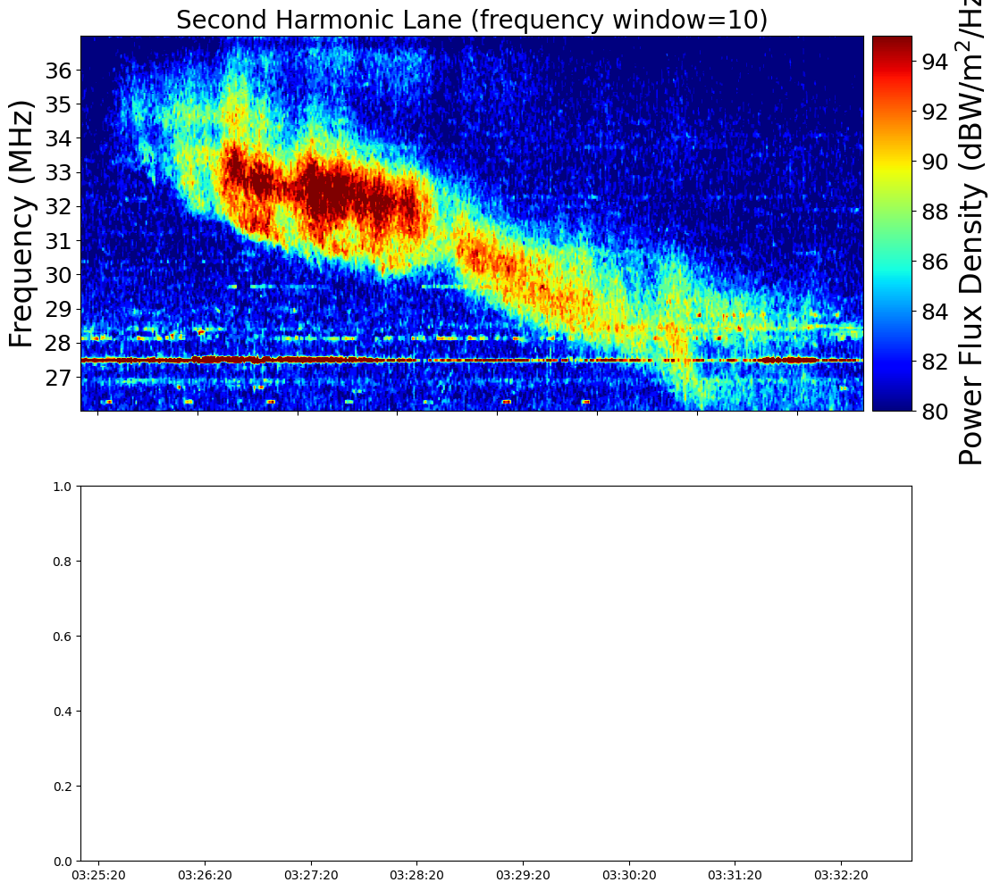

In [6]:
plot_second_harmonic_lane(color_title='Second Harmonic Lane (frequency window=10)')

### ラインプロットをそれぞれ

In [ ]:
def plot_second_harmonic_lane_each_threshold():
    def initial_settings(start_time, end_time, max_frequency, min_frequency, window_spectrum_frequency):
        
        start_frequency = min_frequency
        end_frequency = max_frequency
        
        ##################### スライス #############################
        # 時間範囲でデータをスライス
        time_mask = (time >= start_time) & (time <= end_time)
        lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
        time_sliced = time[time_mask]  # 時間もスライス

        # 周波数範囲でデータをスライス
        freq_mask = (frequency >= start_frequency) & (frequency <= end_frequency)
        lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
        frequency_sliced = frequency[freq_mask]  # 周波数もスライス
        frequency_sliced_mhz = frequency_sliced / 1e6  # MHzに変換

        # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
        window_time_size = 1
        # window_frequency_size = 7
        filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_spectrum_frequency))
        
        return time_sliced, filtered_lh_data, frequency_sliced_mhz

    ########################################################################
    ################## スペクトル ##################
    start_time_spectrum = np.datetime64('2024-06-21T23:50:00')
    end_time_spectrum = np.datetime64('2024-06-21T23:59:59')
    
    max_frequency_spectrum = 43e6
    min_frequency_spectrum = 0e6
    
    window_spectrum_frequency = 1
    
    time_sliced_spectrum, filtered_lh_data_spectrum, frequency_sliced_mhz_spectrum = initial_settings(start_time_spectrum, end_time_spectrum, max_frequency_spectrum, min_frequency_spectrum, window_spectrum_frequency)    
    
    
    #########################################################################
    ##################　前半 ##################
    start_time_1 = np.datetime64('2022-06-13T03:25:10')
    end_time_1 = np.datetime64('2022-06-13T03:28:50')
    
    max_frequency_1 = 37e6
    min_frequency_1 = 29e6
    
    time_sliced_1, filtered_lh_data_1, frequency_sliced_mhz_1 = initial_settings(start_time_1, end_time_1, max_frequency_1, min_frequency_1, window_spectrum_frequency)
    
    
    #########################################################################
    ##################　後半 ##################
    start_time_2 = np.datetime64('2022-06-13T03:28:50')
    end_time_2 = np.datetime64('2022-06-13T03:31:20')
    
    start_frequency_2 = 33e6
    end_frequency_2 = 26e6
    
    time_sliced_2, filtered_lh_data_2, frequency_sliced_mhz_2 = initial_settings(start_time_2, end_time_2, start_frequency_2, end_frequency_2, window_spectrum_frequency)
    
    
    
    
    ######################################################################
    ########################## ax0 ###############################################
    ##################　カラープロット ##################
    fig, axes = plt.subplots(2, 2, figsize=(24, 12), sharex=True, sharey=True)

    ################################### ax0 ##################################
    ax = axes[0, 0]  # Update this line to specifically target a subplot
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)

            # カラープロットの設定
    extent = [mdates.date2num(time_sliced_spectrum[0]), mdates.date2num(time_sliced_spectrum[-1]), frequency_sliced_mhz_spectrum[0], frequency_sliced_mhz_spectrum[-1]]
    img = ax.imshow(filtered_lh_data_spectrum.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

    # カラーバーの追加
    cbar = plt.colorbar(img, cax=cax)
    # cbar.set_label(r'Power Flux Density (dBW/$\rm{m^2}$/Hz)', fontsize=24)
    cbar.ax.tick_params(labelsize=18)

    # 軸ラベルとタイトル
    # ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
    ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)
    ax.set_title(f'Second Harmonic Lane (Window frequency={window_spectrum_frequency}({window_spectrum_frequency*30.5}kHz))', fontsize=20)

    # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time_spectrum)), mdates.date2num(np.datetime64(end_time_spectrum)))

    # 目盛りを設定
    ax.xaxis.set_major_locator(SecondLocator(interval=60*1))  # 時間軸
    y_major_locator = MultipleLocator(1)  # 周波数軸
    ax.yaxis.set_major_locator(y_major_locator)
    
    ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), 26, 37, color='white', linewidth=2, linestyle='--', alpha=0.7)
    ax.text(mdates.date2num(np.datetime64("2022-06-13T03:28:50")), 37, "03:28:50", color="black", fontsize=16, ha="center", va="bottom")


    

    #########################################################################
    ################## 前半 and 後半 Processing in a Loop ####################
    for threshold, color in zip(thresholds, colors):
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        
        center_frequency_label = f'Power$\geq${threshold}'
        fit_line_to_center_frequencies(ax, time_sliced_1, smoothed_frequencies_1, color, threshold)
    
    colors_2 = ['#336699', '#669900', '#996666']
    for threshold, color in zip(thresholds, colors_2):
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        
        fit_line_to_center_frequencies(ax, time_sliced_2, smoothed_frequencies_2, color, threshold)

    #####################################################################################
    def ax_plot_line(ax, threshold, color, color_2):
        lh_data_sliced_filtered_1 = np.where(filtered_lh_data_1 >= threshold, filtered_lh_data_1, np.nan)
        center_frequencies_1 = find_center_frequencies(lh_data_sliced_filtered_1, frequency_sliced_mhz_1, threshold)
        smoothed_frequencies_1 = smoothed_center_frequencies(center_frequencies_1, window_size=1)
        center_frequency_line_plot(ax, time_sliced_1, smoothed_frequencies_1, 1, threshold, color, 'C.F.')
        fit_line_to_center_frequencies(ax, time_sliced_1, smoothed_frequencies_1, color, threshold)
                
        lh_data_sliced_filtered_2 = np.where(filtered_lh_data_2 >= threshold, filtered_lh_data_2, np.nan)
        center_frequencies_2 = find_center_frequencies(lh_data_sliced_filtered_2, frequency_sliced_mhz_2, threshold)
        smoothed_frequencies_2 = smoothed_center_frequencies(center_frequencies_2, window_size=1)
        center_frequency_line_plot(ax, time_sliced_2, smoothed_frequencies_2, 1, threshold, color_2, 'C.F.')
        fit_line_to_center_frequencies(ax, time_sliced_2, smoothed_frequencies_2, color_2, threshold)
        
        ax.vlines(mdates.date2num(np.datetime64('2022-06-13T03:28:50')), 26, 37, color='black', linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(np.datetime64("2022-06-13T03:28:50")), 37, "03:28:50", color="black", fontsize=16, ha="center", va="bottom")
        
        first_valid_index = np.where(~np.isnan(smoothed_frequencies_1))[0][0]
        first_valid_time = time_sliced_1[first_valid_index]
        format_time = first_valid_time.strftime('%H:%M:%S')
        # 垂直線を引く
        ax.axvline(mdates.date2num(first_valid_time), color=color, linewidth=2, linestyle='--', alpha=0.7)
        ax.text(mdates.date2num(first_valid_time), 37, f'{format_time}', color='black', fontsize=16, ha='center', va='bottom')

        ax.tick_params(axis='x', which='both', labelbottom=True, labelsize=18)
        ax.tick_params(axis='y', which='both', labelleft=True, labelsize=18)
        ax.set_xlabel('Time (UT)', fontsize=24)
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
        ax.set_ylabel('Frequency (MHz)', fontsize=24)
        ax.set_title(f'Average frequency; fit lines (Power$\geq${threshold})', fontsize=20)
        ax.legend(loc='best', fontsize=16)
        ax.grid()

    ################################## Apply to Each Subplot ###################################
    ax_plot_line(axes[0, 1], thresholds[0], colors[0], colors_2[0])
    ax_plot_line(axes[1, 0], thresholds[1], colors[1], colors_2[1])
    ax_plot_line(axes[1, 1], thresholds[2], colors[2], colors_2[2])

    plt.tight_layout()
    plt.show()


Slope (MHz/s) [Power>=95]: -8.3767e-03, Intercept: 3.2875e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: 5.0782e-04
Intercept standard deviation (MHz) [Power>=95]: 3.4166e-02 

Slope (MHz/s) [Power>=90]: -1.1405e-02, Intercept: 3.3198e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 3.9505e-04
Intercept standard deviation (MHz) [Power>=90]: 3.7139e-02 

Slope (MHz/s) [Power>=85]: -1.5862e-02, Intercept: 3.4474e+01 MHz
Slope standard deviation (MHz/s) [Power>=85]: 3.4158e-04
Intercept standard deviation (MHz) [Power>=85]: 3.8803e-02 

Slope (MHz/s) [Power>=95]: -2.4093e-02, Intercept: 3.0563e+01 MHz
Slope standard deviation (MHz/s) [Power>=95]: inf
Intercept standard deviation (MHz) [Power>=95]: inf 

Slope (MHz/s) [Power>=90]: -2.1885e-02, Intercept: 3.0868e+01 MHz
Slope standard deviation (MHz/s) [Power>=90]: 5.0850e-04
Intercept standard deviation (MHz) [Power>=90]: 4.3216e-02 

Slope (MHz/s) [Power>=85]: -1.7706e-02, Intercept: 3.0781e+01 MHz
Slope standard deviation (MH

/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4318: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/kinno-7010/Document/Iwai2020event/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: divide by zero encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


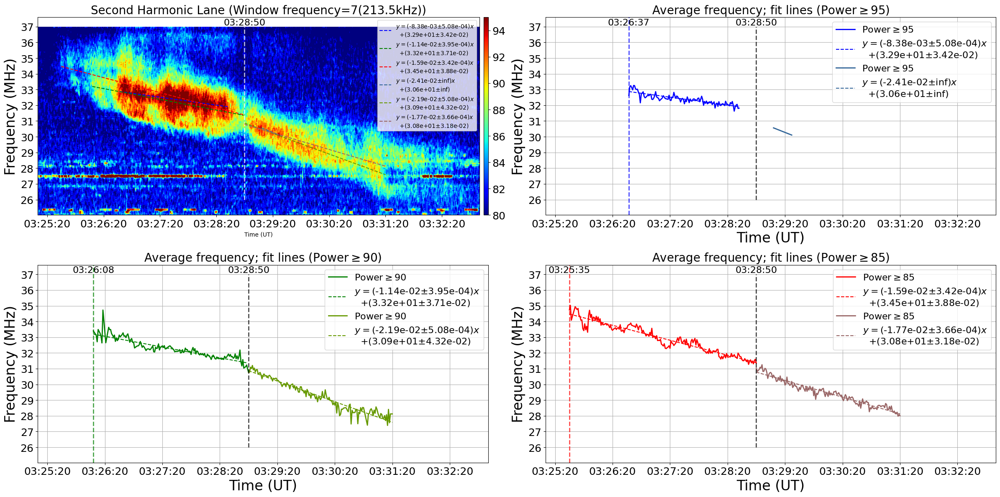

In [46]:
plot_second_harmonic_lane_each_threshold()

### 1/f -t

In [25]:
vmin=85
vmax=115
def plot_inverse_frequency_data():
    # 周波数をHzからMHzに変換
    start_frequency = 1e6

    end_frequency = 43e6

    start_time = np.datetime64('2024-06-21T23:45:00')
    end_time = np.datetime64('2024-06-21T23:59:59')
    
    time_interval = 60*2
    frequency_interval = 1
    
    title = 'Second Harmonic Lane (1/f - time) (log scale)'
    window_frequency_size = 1

    #####################スライス#############################
    # 時間範囲でデータをスライス
    time_mask = (time >= start_time) & (time <= end_time)
    lh_data_sliced = lh_data[time_mask, :]  # 時間でスライス
    time_sliced = time[time_mask]  # 時間もスライス

    # 周波数範囲でデータをスライス
    inverse_frequency = 1 / frequency
    freq_mask = (inverse_frequency >= 1/end_frequency) & (inverse_frequency <= 1/start_frequency)
    lh_data_sliced = lh_data_sliced[:, freq_mask]  # 周波数でスライス
    frequency_sliced = inverse_frequency[freq_mask]  # 周波数もスライス
    frequency_sliced_mhz = frequency_sliced / 1e-6  # MHzに変換

    # 移動中央値フィルタの適用 (周波数軸に沿って) = ノイズを軽減
    window_time_size = 1
    filtered_lh_data = median_filter(lh_data_sliced, size=(window_time_size, window_frequency_size))

    ##########################カラープロットの作成##################################
    fig, ax = plt.subplots(figsize=(12, 6))

    # カラーバーを図の右側に追加
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="1%", pad=0.1)  # sizeはカラーバーの幅, padは間隔

    # カラープロットの設定
    extent = [mdates.date2num(time_sliced[0]), mdates.date2num(time_sliced[-1]), frequency_sliced_mhz[0], frequency_sliced_mhz[-1]]
    img = ax.imshow(filtered_lh_data.T, aspect='auto', origin='lower', extent=extent, vmin=vmin, vmax=vmax, cmap='jet')

    # カラーバーの追加
    cbar = plt.colorbar(img, cax=cax)
    # cbar.set_label(r'Power Flux Density (dBW/$\rm{m^2}$/Hz)', fontsize=24)
    cbar.ax.tick_params(labelsize=18)

    # 軸ラベルとタイトル
    ax.set_xlabel('Time (UT)', fontsize=24)
    ax.set_ylabel('Frequency (MHz)', fontsize=24)
    ax.tick_params(axis='both', labelsize=18)

    ax.set_title(title, fontsize=20)

    # 時間軸のフォーマット設定
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_xlim(mdates.date2num(np.datetime64(start_time)), mdates.date2num(np.datetime64(end_time)))

    # 目盛りを設定
    ax.xaxis.set_major_locator(mdates.SecondLocator(interval=time_interval))  # 60秒ごとに目盛りを追加
    y_major_locator = MultipleLocator(1/500)  # 1MHzごとに目盛を追加
    ax.yaxis.set_major_locator(y_major_locator)
    ax.set_yscale('log')
    # y軸を反転
    ax.invert_yaxis()

    # レイアウトの調整
    plt.tight_layout()
    plt.show()

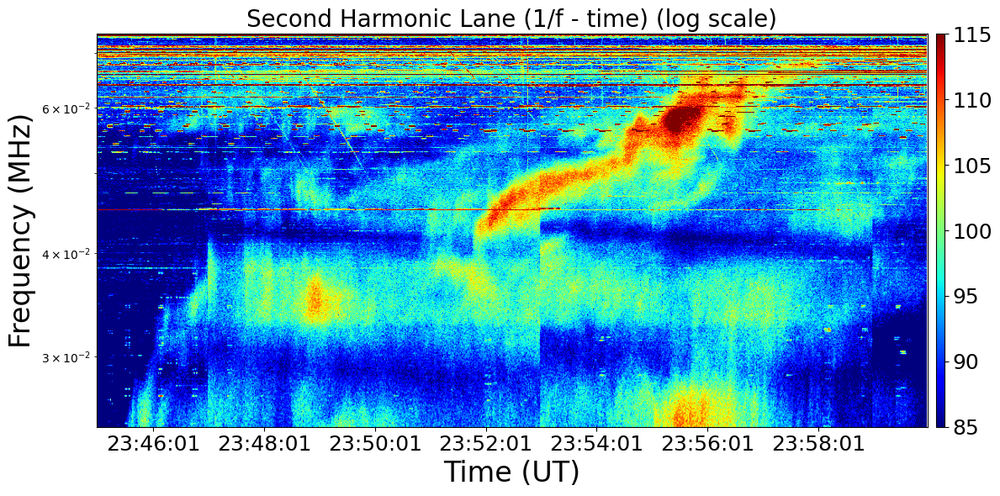

In [26]:
plot_inverse_frequency_data()  

# メモ

In [ ]:
# # median_filterを適用する
# def smoothed_center_frequencies(center_frequencies, window_size):
#     """
#     平滑化された中心周波数を計算する関数。メディアンフィルタを適用する。
    
#     Parameters:
#     center_frequencies (ndarray): 計算された中心周波数
#     window_size (int): メディアンフィルタのウィンドウサイズ
    
#     Returns:
#     ndarray: 平滑化された中心周波数
#     """
#     # 平滑化前にNaNを適切に扱う
#     center_frequencies_series = pd.Series(center_frequencies)
    
#     # numpy配列に変換
#     center_frequencies_np = center_frequencies_series.to_numpy()
    
#     # NaNを一時的に埋める（median_filterはNaNを扱えないため）
#     if np.isnan(center_frequencies_np).all():
#         # すべてのデータがNaNの場合、NaNのまま返す
#         return center_frequencies_np
#     else:
#         # NaNを無視して平均を計算
#         center_frequencies_np_nonan = np.nan_to_num(center_frequencies_np, nan=np.nanmean(center_frequencies_np))
    
#     # median_filterを使って移動中央値を計算
#     smoothed = median_filter(center_frequencies_np_nonan, size=window_size)
    
#     # もとのNaN部分を復元
#     smoothed = np.where(np.isnan(center_frequencies_np), np.nan, smoothed)
    
#     return smoothed

# 指数移動平均を適用する
# def smoothed_center_frequencies(center_frequencies, window_size):
#         # numpy.ndarray を pandas.Series に変換
#     center_frequencies_series = pd.Series(center_frequencies)
    
#     # 指数移動平均 (Exponential Moving Average) を計算
#     smoothed = center_frequencies_series.ewm(span=window_size, adjust=False).mean()
    
#     # numpy.ndarray に戻して返す
#     return smoothed.to_numpy()

# # gaussian_filterを適用する
# from scipy.ndimage import gaussian_filter

# def smoothed_center_frequencies(center_frequencies, window_size):
#     # numpy.ndarray を pandas.Series に変換
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
#     smoothed = gaussian_filter(center_frequencies_filled, sigma=window_size)
#     return smoothed


# # Savitzky-Golayフィルタを適用する
# from scipy.signal import savgol_filter
# def smoothed_center_frequencies(center_frequencies, window_size):
#     # numpy.ndarray を pandas.Series に変換
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
#     smoothed = savgol_filter(center_frequencies_filled, window_length=window_size, polyorder=2)
#     return smoothed

# # # バターワースフィルタを適用する
# from scipy.signal import butter, filtfilt
# def smoothed_center_frequencies(center_frequencies, window_size):
#     # バターワースフィルタの設計
#     b, a = butter(N=3, Wn=0.05)
    
#     # NaNチェック - 全てのデータがNaNの場合
#     if np.isnan(center_frequencies).all():
#         print("Warning: All values are NaN. Returning NaN array.")
#         return center_frequencies  # 全てNaNならそのままNaNを返す
    
#     # NaN部分をデータの平均で埋める
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
    
#     # バターワースフィルタを適用
#     smoothed = filtfilt(b, a, center_frequencies_filled)
    
#     # 元のデータにNaNがあれば、それを復元
#     smoothed[np.isnan(center_frequencies)] = np.nan
    
#     return smoothed

# スプライン補間を適用する
# from scipy.interpolate import UnivariateSpline
# def smoothed_center_frequencies(center_frequencies, window_size):
#         # NaNチェック - 全てのデータがNaNの場合
#     if np.isnan(center_frequencies).all():
#         print("Warning: All values are NaN. Returning NaN array.")
#         return center_frequencies  # 全てNaNならそのままNaNを返す
    
#     # NaN部分をデータの平均で埋める
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
    
#     # スプライン補間を適用
#     spline = UnivariateSpline(np.arange(len(center_frequencies_filled)), center_frequencies_filled, s=window_size)
#     smoothed = spline(np.arange(len(center_frequencies_filled)))
    
#     # 元のデータにNaNがあれば、それを復元
#     smoothed[np.isnan(center_frequencies)] = np.nan
    
#     return smoothed

# Kalmanフィルタを適用する
# import pykalman
# from pykalman import KalmanFilter
# def smoothed_center_frequencies(center_frequencies, window_size):
#         # NaNチェック - 全てのデータがNaNの場合
#     if np.isnan(center_frequencies).all():
#         print("Warning: All values are NaN. Returning NaN array.")
#         return center_frequencies  # 全てNaNならそのままNaNを返す
    
#     # NaN部分をデータの平均で埋める
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
    
#     # カリマンフィルタのセットアップ
#     kf = KalmanFilter(initial_state_mean=center_frequencies_filled[0], n_dim_obs=1)
    
#     # カリマンフィルタによる平滑化
#     smoothed_state_means, _ = kf.smooth(center_frequencies_filled)
    
#     # 元のデータにNaNがあれば、それを復元
#     smoothed_state_means[np.isnan(center_frequencies)] = np.nan
    
#     return smoothed_state_means.flatten()

# # ウェーブレット変換を適用する
# import pywt
# def smoothed_center_frequencies(center_frequencies, window_size):
#        # NaNチェック - 全てのデータがNaNの場合
#     if np.isnan(center_frequencies).all():
#         print("Warning: All values are NaN. Returning NaN array.")
#         return center_frequencies  # 全てNaNならそのままNaNを返す
    
#     # NaN部分をデータの平均で埋める
#     center_frequencies_filled = np.nan_to_num(center_frequencies, nan=np.nanmean(center_frequencies))
    
#     # ウェーブレット変換としきい値処理
#     coeff = pywt.wavedec(center_frequencies_filled, 'db3', level=3)
#     coeff[1:] = [pywt.threshold(i, value=0.5, mode='hard') for i in coeff[1:]]
    
#     # ウェーブレット逆変換
#     smoothed = pywt.waverec(coeff, 'db3')
    
#     # 元のデータの長さに一致させる
#     smoothed = smoothed[:len(center_frequencies_filled)]
    
#     # 元のデータにNaNがあれば、それを復元
#     smoothed[np.isnan(center_frequencies)] = np.nan
    
#     return smoothed

In [ ]:
# Nanでも配列に入れる場合(配列の長さが変わらない)
# def remove_outliers(data, threshold=3.0):
#     mean = np.nanmean(data)
#     std = np.nanstd(data)
#     z_scores = np.abs((data - mean) / std)
    
#     # 閾値を超えたデータをNaNにする
#     filtered_data = np.where(z_scores > threshold, np.nan, data)
    
#     return filtered_data

In [18]:
# # ドリフトレートを計算する関数(外れ値あり)
# def calculate_drift_rate(center_frequencies, time_sliced):
#     """
#     中心周波数のドリフトレートを計算し、外れ値を除去します。
#     """
#     valid_indices = ~np.isnan(center_frequencies[:-1])
#     time_sliced_valid = time_sliced[:-1][valid_indices]
#     center_frequencies_valid = center_frequencies[:-1][valid_indices]

#     # 周波数差分と時間差分を計算
#     freq_diff = np.diff(center_frequencies_valid)
#     time_diff = np.diff(time_sliced_valid.values).astype('timedelta64[ms]').astype(float) / 1000.0

#     # 外れ値を除去
#     freq_diff_no_outliers = remove_outliers(freq_diff)
#     time_diff_no_outliers = time_diff[:len(freq_diff_no_outliers)]

#     # ドリフトレートを計算
#     freq_rate = freq_diff / time_diff
    
#     ave_freq_rate = np.mean(freq_rate)
    
#     return freq_rate